<a href="https://colab.research.google.com/github/soyeonimu/Codeit_Sprint/blob/main/%5B%EC%8A%A4%ED%94%84%EB%A6%B0%ED%8A%B8%EB%AF%B8%EC%85%98%5D9_%E1%84%87%E1%85%AE%E1%86%AB%E1%84%89%E1%85%A5%E1%86%A8%E1%84%89%E1%85%B5%E1%86%AF%E1%84%89%E1%85%B3%E1%86%B8_3%E1%84%90%E1%85%B5%E1%86%B7_%E1%84%80%E1%85%B5%E1%86%B7%E1%84%89%E1%85%A9%E1%84%8B%E1%85%A7%E1%86%AB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

___
# 스프린트미션 8
___

In [ ]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid", palette="bright")

In [ ]:
data = pd.read_csv('credit_card.csv')
data.head(3)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.0,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.0,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.0,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

# EDA

> 결측값

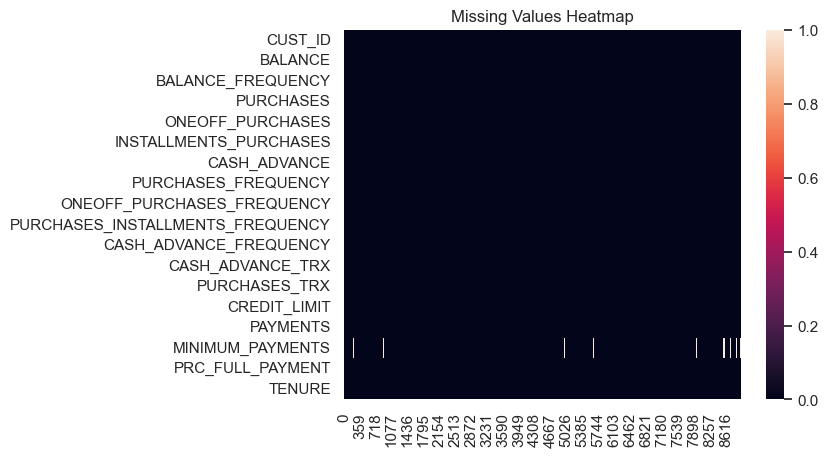

In [ ]:

sns.heatmap(data.isnull().T)
plt.title('Missing Values Heatmap')
plt.show()

In [ ]:
data.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

- CREDIT_LIMIT 1개
- MINIMUM_PAYMENTS 313개

___

> 이상치

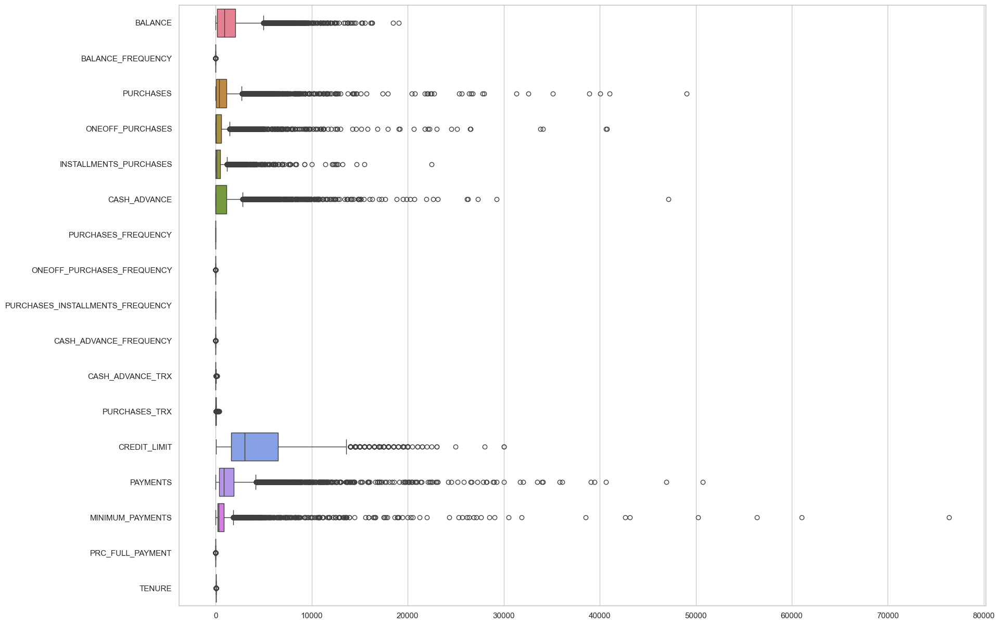

In [ ]:
plt.figure(figsize=(20,15))
sns.boxplot(data=data, orient='h')
plt.show()

- 이상치로 분류되는 값이 많다. 골라서 제거

***

> 중복값

In [ ]:
duplicate_count = data.duplicated().sum()
print(f"중복된 행의 수: {duplicate_count}")

중복된 행의 수: 0


***

> 전체 분포

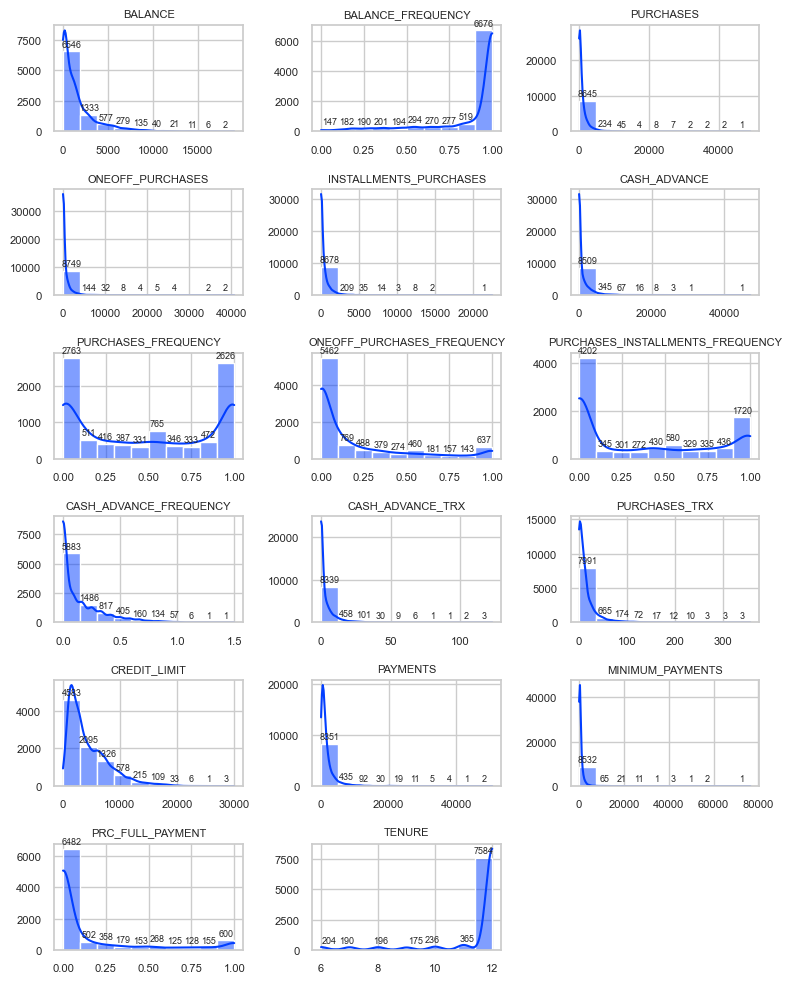

In [ ]:
numeric_columns = data.select_dtypes(include=['int64','float64'])

# 데이터의 분포를 자세히 살펴보기
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(8, 10))  # 17개
axes = axes.flatten()

for i, col in enumerate(numeric_columns):  # 열 이름과 인덱스 동시 접근
    ax = axes[i]
    hist_data = sns.histplot(x=data[col], ax=ax, bins=10, kde=True)
    ax.set_title(col, fontsize=8)
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.tick_params(axis='x', labelsize=8)  # x축 숫자 폰트 크기
    ax.tick_params(axis='y', labelsize=8)  # y축 숫자 폰트 크기

    # 각 bin의 수치를 추가하기
    for patch in hist_data.patches:
        height = patch.get_height()
        if height > 0:  # 높이가 0보다 큰 경우만 표시
            ax.annotate(f'{int(height)}',  # 정수 형태로 표시
                        xy=(patch.get_x() + patch.get_width() / 2, height),  # 텍스트 위치 (bin의 중심)
                        xytext=(0, 2),  # 텍스트 위치 조정
                        textcoords='offset points',  # 기준 좌표에서 오프셋
                        ha='center', va='bottom', fontsize=6.5)

fig.delaxes(axes[-1])  # 마지막 축 삭제
plt.tight_layout()
plt.show()

치우친 경향이 많다

***
## 처리
***

> 결측값

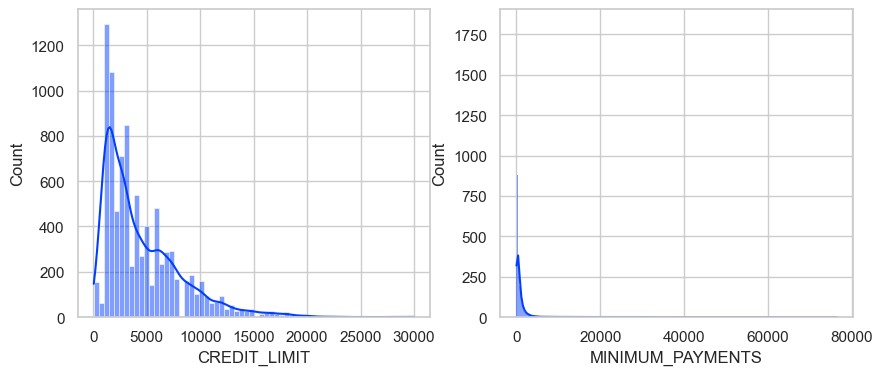

In [ ]:
plt.figure(figsize=(10,4))
plt.subplot(1, 2, 1)
sns.histplot(data['CREDIT_LIMIT'], kde=True)
plt.subplot(1, 2, 2)
sns.histplot(data['MINIMUM_PAYMENTS'], kde=True)
plt.show()

- CREDIT_LIMIT 처리

In [ ]:
data[data['CREDIT_LIMIT'].isna()]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,C15349,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


In [ ]:
data_corr = numeric_columns.corr().sort_values(by='CREDIT_LIMIT',ascending=False)
data_corr['CREDIT_LIMIT'][:2]

CREDIT_LIMIT    1.000000
BALANCE         0.531283
Name: CREDIT_LIMIT, dtype: float64

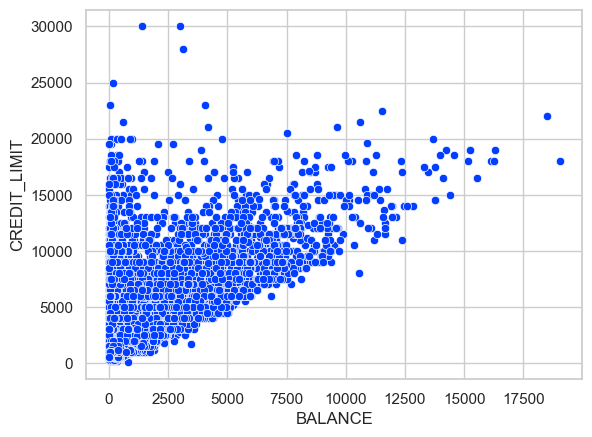

In [ ]:
sns.scatterplot(x=data['BALANCE'], y=data['CREDIT_LIMIT'])
plt.show()

1. BALANCE와 CREDIT_LIMIT 모두 값이 0 근처에 많이 몰려있음.
2. 값이 클수록 데이터가 더 넓게 퍼진다.
3. 하한선이 우상향  
=> 잔액이 오를수록 최저 신용 한도가 오르는 경향이 있지만, 잔액이 0인 상태에서는 카드의 한도가 제각각이기 때문에,
    전 미션에서 했던 비율처리가 합당하지 않을 수도 있지않을까..

- 중앙값으로 처리

In [ ]:
data['CREDIT_LIMIT'] = data['CREDIT_LIMIT'].fillna(data['CREDIT_LIMIT'].median())

---

- MINIMUM_PAYMENTS 처리

In [ ]:
data[data['MINIMUM_PAYMENTS'].isna()].head(3)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
3,C10004,1666.670542,0.636364,1499.0,1499.0,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.0,NaN,0.0,12
45,C10047,2242.311686,1.000000,437.0,97.0,340.0,184.648692,0.333333,0.083333,0.333333,0.166667,2,5,2400.0,0.0,NaN,0.0,12
47,C10049,3910.111237,1.000000,0.0,0.0,0.0,1980.873201,0.000000,0.000000,0.000000,0.500000,7,0,4200.0,0.0,NaN,0.0,12


In [ ]:
data_corr = data.select_dtypes(include=['int64','float64']).corr().sort_values(by='MINIMUM_PAYMENTS',ascending=False)
data_corr['MINIMUM_PAYMENTS'][:5]

MINIMUM_PAYMENTS          1.000000
BALANCE                   0.398684
CASH_ADVANCE              0.140107
BALANCE_FREQUENCY         0.132569
INSTALLMENTS_PURCHASES    0.132172
Name: MINIMUM_PAYMENTS, dtype: float64

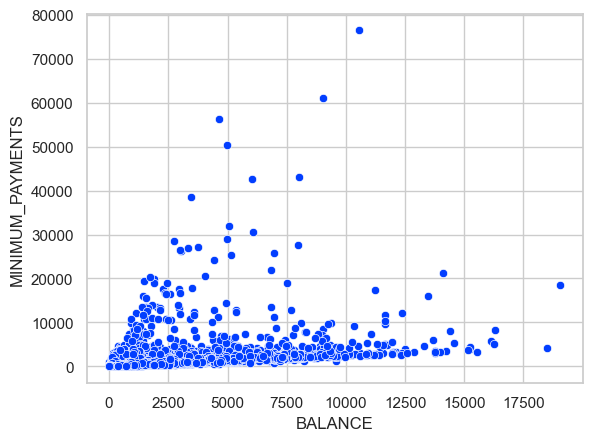

In [ ]:
sns.scatterplot(x=data['BALANCE'], y=data['MINIMUM_PAYMENTS'])
plt.show()

- 중앙값으로 처리

In [ ]:
data['MINIMUM_PAYMENTS'] = data['MINIMUM_PAYMENTS'].fillna(data['MINIMUM_PAYMENTS'].median())

In [ ]:
data.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

___
## 원본 데이터 기술 통계
___

In [ ]:
data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.282473,1733.143852,844.906767,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.646702,2895.063757,2332.792322,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,170.857654,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,788.713501,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


---
## 이상치 처리
---

In [ ]:
selected_columns = ['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES',
                    'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS']


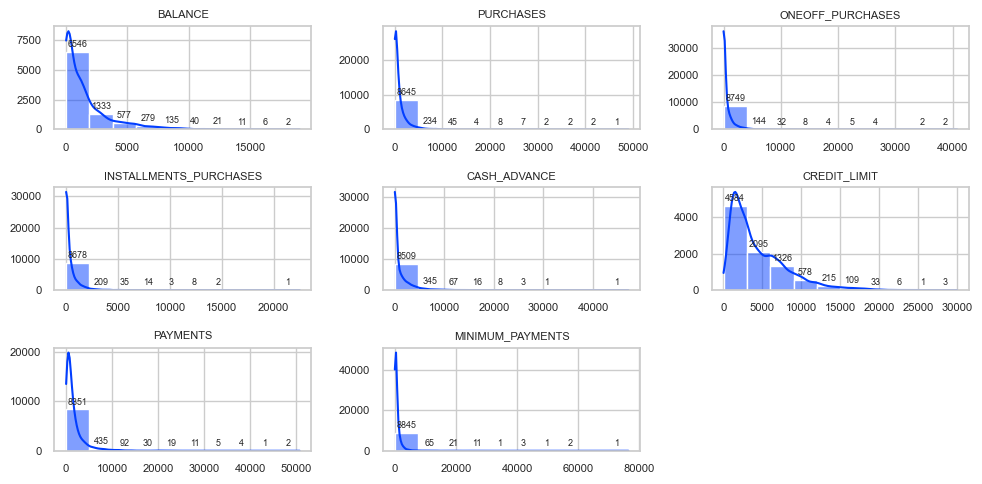

In [ ]:
# 해당 데이터의 분포를 자세히 살펴보기
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 5))
axes = axes.flatten()

for i, col in enumerate(selected_columns):  # 열 이름과 인덱스 동시 접근
    ax = axes[i]
    hist_data = sns.histplot(x=data[col], ax=ax, bins=10, kde=True)
    ax.set_title(col, fontsize=8)
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.tick_params(axis='x', labelsize=8)  # x축 숫자 폰트 크기
    ax.tick_params(axis='y', labelsize=8)  # y축 숫자 폰트 크기

    # 각 bin의 수치를 추가하기
    for patch in hist_data.patches:
        height = patch.get_height()
        if height > 0:  # 높이가 0보다 큰 경우만 표시
            ax.annotate(f'{int(height)}',  # 정수 형태로 표시
                        xy=(patch.get_x() + patch.get_width() / 2, height),  # 텍스트 위치 (bin의 중심)
                        xytext=(0, 2),  # 텍스트 위치 조정
                        textcoords='offset points',  # 기준 좌표에서 오프셋
                        ha='center', va='bottom', fontsize=6.5)


fig.delaxes(axes[-1])  # 마지막 축 삭제
plt.tight_layout()
plt.show()

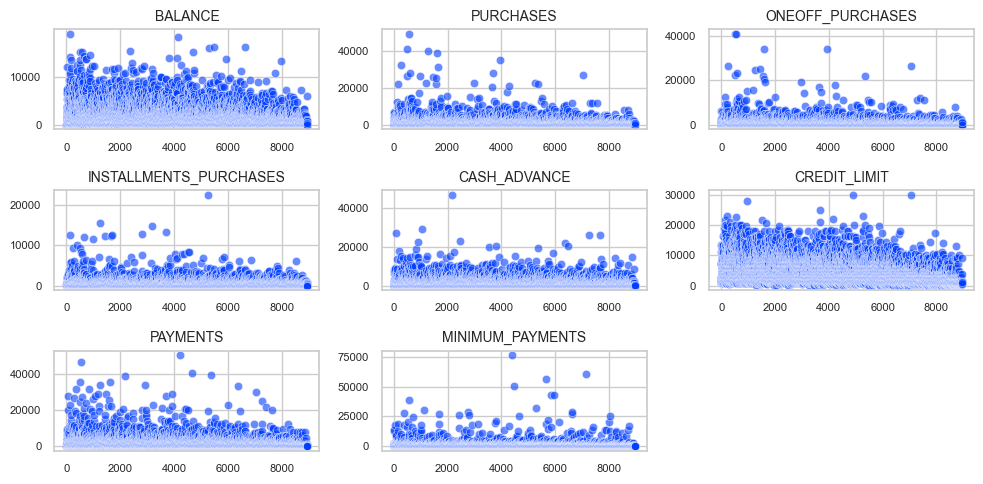

In [ ]:
# 해당 데이터의 분포를 자세히 살펴보기
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 5))
axes = axes.flatten()

# 각 열에 대해 scatterplot 그리기
for i, col in enumerate(selected_columns):
    ax = axes[i]
    sns.scatterplot(x=data.index, y=data[col], ax=ax, alpha=0.6)
    ax.set_title(col, fontsize=10)
    ax.set_xlabel("")  # x축 레이블 제거
    ax.set_ylabel("")  # y축 레이블 제거
    ax.tick_params(axis='x', labelsize=8)  # x축 숫자 폰트 크기
    ax.tick_params(axis='y', labelsize=8)  # y축 숫자 폰트 크기

fig.delaxes(axes[-1])  # 마지막 축 삭제
plt.tight_layout()
plt.show()

- 데이터 분포가 복잡하기때문에, 실제로 이상치인지 판단이 어렵다.
-  제거는 하지않고 로그로 변환해서 분석해보기로했다.
***

In [ ]:
import numpy as np
from copy import deepcopy

# 원본 데이터 복사
log_transformed_data = deepcopy(data)

# 선택된 열에 로그 변환 적용
for col in selected_columns:
    # 로그 변환 (log(1 + x))
    log_transformed_data[col] = np.log1p(log_transformed_data[col])

# 결과 확인
log_transformed_data


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,3.735304,0.818182,4.568506,0.000000,4.568506,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,6.908755,5.312231,4.945277,0.000000,12
1,C10002,8.071989,0.909091,0.000000,0.000000,0.000000,8.770896,0.000000,0.000000,0.000000,0.250000,4,0,8.853808,8.319725,6.978531,0.222222,12
2,C10003,7.822504,1.000000,6.651791,6.651791,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,8.922792,6.434654,6.442994,0.000000,12
3,C10004,7.419183,0.636364,7.313220,7.313220,0.000000,5.331694,0.083333,0.083333,0.000000,0.083333,1,1,8.922792,0.000000,5.747301,0.000000,12
4,C10005,6.707735,1.000000,2.833213,2.833213,0.000000,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,7.090910,6.521114,5.504483,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,3.384170,1.000000,5.677165,0.000000,5.677165,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,6.908755,5.788719,3.909748,0.500000,6
8946,C19187,3.004851,1.000000,5.707110,0.000000,5.707110,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,6.908755,5.623517,5.747301,0.000000,6
8947,C19188,3.194529,0.833333,4.979489,0.000000,4.979489,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,6.908755,4.410016,4.423869,0.250000,6
8948,C19189,2.671218,0.833333,0.000000,0.000000,0.000000,3.625907,0.000000,0.000000,0.000000,0.166667,2,0,6.216606,3.980615,4.038755,0.250000,6


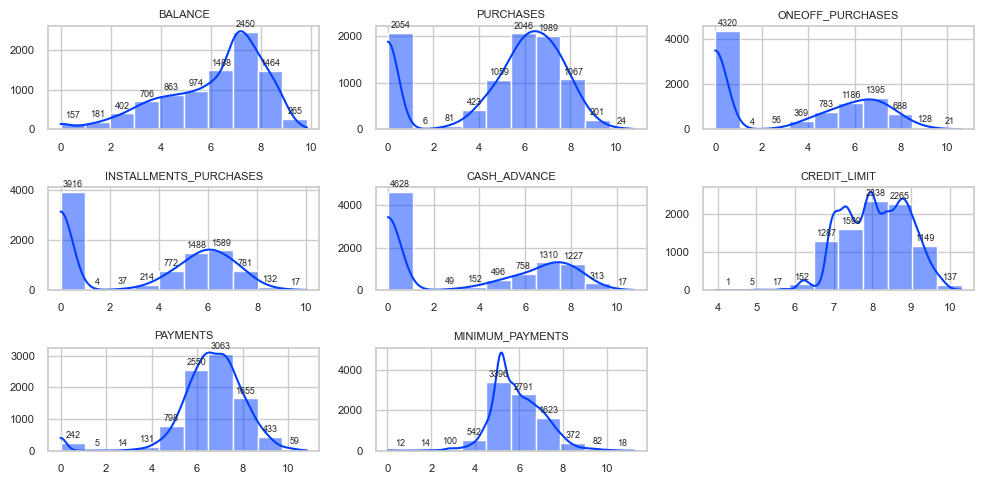

In [ ]:
# 해당 데이터의 분포를 자세히 살펴보기
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 5))
axes = axes.flatten()

for i, col in enumerate(selected_columns):  # 열 이름과 인덱스 동시 접근
    ax = axes[i]
    hist_data = sns.histplot(x=log_transformed_data[col], ax=ax, bins=10, kde=True)
    ax.set_title(col, fontsize=8)
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.tick_params(axis='x', labelsize=8)  # x축 숫자 폰트 크기
    ax.tick_params(axis='y', labelsize=8)  # y축 숫자 폰트 크기

    # 각 bin의 수치를 추가하기
    for patch in hist_data.patches:
        height = patch.get_height()
        if height > 0:  # 높이가 0보다 큰 경우만 표시
            ax.annotate(f'{int(height)}',  # 정수 형태로 표시
                        xy=(patch.get_x() + patch.get_width() / 2, height),  # 텍스트 위치 (bin의 중심)
                        xytext=(0, 2),  # 텍스트 위치 조정
                        textcoords='offset points',  # 기준 좌표에서 오프셋
                        ha='center', va='bottom', fontsize=6.5)


fig.delaxes(axes[-1])  # 마지막 축 삭제
plt.tight_layout()
plt.show()

___
### 표준화
___

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
# 표준화 적용
# 숫자형 열 선택
numeric_columns = log_transformed_data.select_dtypes(include=['int64', 'float64']).columns

# 숫자형 데이터 추출
numeric_data = log_transformed_data[numeric_columns]

# 표준화 적용
scaler = StandardScaler()
data_scaled = scaler.fit_transform(numeric_data)

# 표준화된 데이터를 데이터프레임으로 변환
standardized_data = pd.DataFrame(data_scaled, columns=numeric_columns, index=log_transformed_data.index)
standardized_data


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-1.205218,-0.249434,-0.113532,-0.987090,0.394480,-0.930733,-0.806490,-0.678661,-0.707313,-0.675349,-0.476070,-0.511333,-1.447163,-0.824484,-0.829841,-0.525551,0.360680
1,0.948918,0.134325,-1.679855,-0.987090,-1.087454,1.528788,-1.221758,-0.678661,-0.916995,0.573963,0.110074,-0.591796,0.926060,1.065033,0.908184,0.234227,0.360680
2,0.824993,0.518084,0.600727,1.062022,-1.087454,-0.930733,1.269843,2.673451,-0.916995,-0.675349,-0.476070,-0.109020,1.010229,-0.119300,0.450407,-0.525551,0.360680
3,0.624653,-1.016953,0.827499,1.265778,-1.087454,0.564372,-1.014125,-0.399319,-0.916995,-0.258913,-0.329534,-0.551565,1.010229,-4.161996,-0.144271,-0.525551,0.360680
4,0.271260,0.518084,-0.708481,-0.114307,-1.087454,-0.930733,-1.014125,-0.399319,-0.916995,-0.675349,-0.476070,-0.551565,-1.224909,-0.064979,-0.351833,-0.525551,0.360680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,-1.379634,0.518084,0.266574,-0.987090,0.754107,-0.930733,1.269843,-0.678661,1.179833,-0.675349,-0.476070,-0.350408,-1.447163,-0.525121,-1.715012,1.183951,-4.122768
8946,-1.568051,0.518084,0.276841,-0.987090,0.763821,-0.930733,1.269843,-0.678661,1.179833,-0.675349,-0.476070,-0.350408,-1.447163,-0.628912,-0.144271,-0.525551,-4.122768
8947,-1.473834,-0.185477,0.027374,-0.987090,0.527794,-0.930733,0.854576,-0.678661,0.760469,-0.675349,-0.476070,-0.390639,-1.447163,-1.391318,-1.275542,0.329200,-4.122768
8948,-1.733775,-0.185477,-1.679855,-0.987090,-1.087454,0.086038,-1.221758,-0.678661,-0.916995,0.157527,-0.182998,-0.591796,-2.291676,-1.661097,-1.604737,0.329200,-4.122768


___
# PCA 주성분 분석
___

In [ ]:
from sklearn.decomposition import PCA

for_cpa = deepcopy(standardized_data)
for_cpa

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-1.205218,-0.249434,-0.113532,-0.987090,0.394480,-0.930733,-0.806490,-0.678661,-0.707313,-0.675349,-0.476070,-0.511333,-1.447163,-0.824484,-0.829841,-0.525551,0.360680
1,0.948918,0.134325,-1.679855,-0.987090,-1.087454,1.528788,-1.221758,-0.678661,-0.916995,0.573963,0.110074,-0.591796,0.926060,1.065033,0.908184,0.234227,0.360680
2,0.824993,0.518084,0.600727,1.062022,-1.087454,-0.930733,1.269843,2.673451,-0.916995,-0.675349,-0.476070,-0.109020,1.010229,-0.119300,0.450407,-0.525551,0.360680
3,0.624653,-1.016953,0.827499,1.265778,-1.087454,0.564372,-1.014125,-0.399319,-0.916995,-0.258913,-0.329534,-0.551565,1.010229,-4.161996,-0.144271,-0.525551,0.360680
4,0.271260,0.518084,-0.708481,-0.114307,-1.087454,-0.930733,-1.014125,-0.399319,-0.916995,-0.675349,-0.476070,-0.551565,-1.224909,-0.064979,-0.351833,-0.525551,0.360680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,-1.379634,0.518084,0.266574,-0.987090,0.754107,-0.930733,1.269843,-0.678661,1.179833,-0.675349,-0.476070,-0.350408,-1.447163,-0.525121,-1.715012,1.183951,-4.122768
8946,-1.568051,0.518084,0.276841,-0.987090,0.763821,-0.930733,1.269843,-0.678661,1.179833,-0.675349,-0.476070,-0.350408,-1.447163,-0.628912,-0.144271,-0.525551,-4.122768
8947,-1.473834,-0.185477,0.027374,-0.987090,0.527794,-0.930733,0.854576,-0.678661,0.760469,-0.675349,-0.476070,-0.390639,-1.447163,-1.391318,-1.275542,0.329200,-4.122768
8948,-1.733775,-0.185477,-1.679855,-0.987090,-1.087454,0.086038,-1.221758,-0.678661,-0.916995,0.157527,-0.182998,-0.591796,-2.291676,-1.661097,-1.604737,0.329200,-4.122768


In [ ]:
# PCA 적용
pca = PCA()
data_pca = pca.fit_transform(for_cpa)  # PCA 수행

explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = explained_variance_ratio.cumsum()
print("누적 설명력:", cumulative_variance_ratio)

누적 설명력: [0.29861658 0.51772257 0.61111768 0.68796436 0.75311724 0.80359704
 0.8460734  0.87841106 0.90946076 0.93511488 0.95434557 0.9698872
 0.97839704 0.9866926  0.99297929 0.99842045 1.        ]


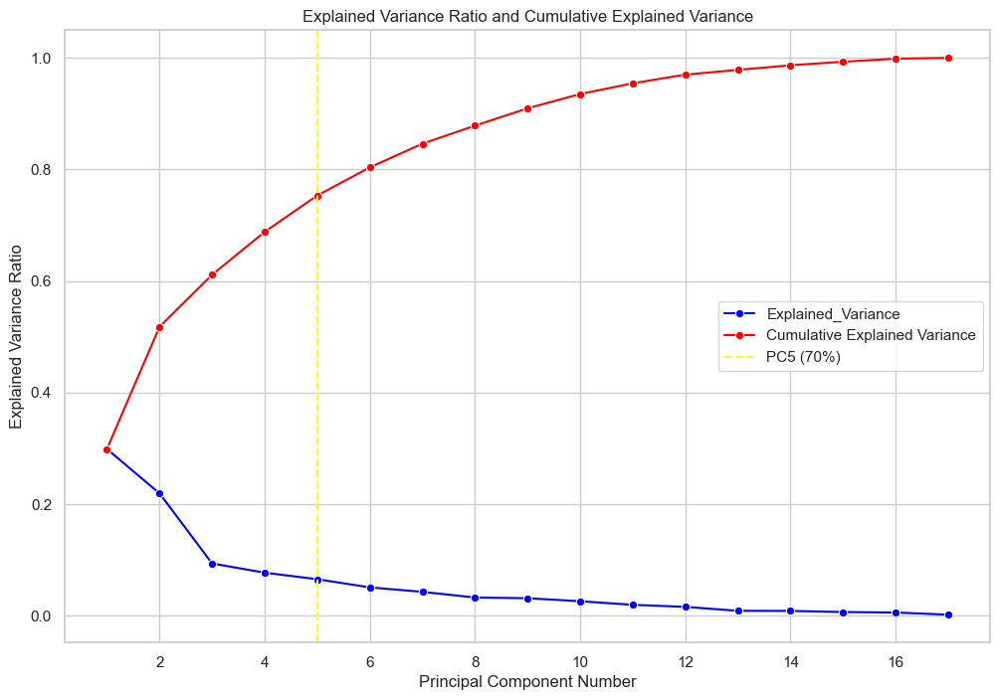

In [ ]:
# 시각화
plt.figure(figsize=(12, 8))
sns.lineplot(x=range(1, len(explained_variance_ratio) + 1), y=explained_variance_ratio,
             marker='o', label='Explained_Variance', color='blue')
sns.lineplot(x=range(1, len(cumulative_variance_ratio) + 1), y=cumulative_variance_ratio,
             marker='o', linestyle='-', color='red', label='Cumulative Explained Variance')

# 누적합이 70%에 도달하는 지점에 수직 파선 추가
threshold_index = np.argmax(cumulative_variance_ratio >= 0.7)  # 누적 설명력이 70% 이상이 되는 첫 번째 인덱스
plt.axvline(x=threshold_index + 1, color='Yellow', linestyle='--', label=f"PC{threshold_index + 1} (70%)")

# 축 및 제목 설정
plt.xlabel('Principal Component Number')  # 주성분번호
plt.ylabel('Explained Variance Ratio')  # 설명분산비율
plt.title('Explained Variance Ratio and Cumulative Explained Variance')  # 설명 분산 비율과 누적 설명 분산
plt.legend()
plt.grid(True)

plt.show()

- 4개가 68% 를 설명함
- 5개가 74% 를 설명함

(실루엣 점수를 통해 기존 5개에서 4개로 변경)

In [ ]:
pca = PCA(n_components=4) # n components = 4
data_pca = pca.fit_transform(for_cpa)
pca_df = pd.DataFrame(data_pca, columns=['PC1','PC2','PC3','PC4']) #, 'PC5'
pca_df


,PC1,PC2,PC3,PC4
0,-0.551286,-2.545012,-0.309568,-0.875060
1,-2.948913,1.237305,0.032686,-0.231854
2,1.351829,1.229987,2.684535,-0.919355
3,-1.217276,-1.094976,1.875784,-0.610212
4,-1.264395,-1.074701,0.791396,-1.550921
...,...,...,...,...
8945,1.379261,-2.933274,-2.122266,1.804348
8946,0.942630,-2.229034,-2.270147,0.694982
8947,0.600022,-3.278132,-1.721824,1.437318
8948,-2.658146,-3.675332,-0.406445,1.796757


<Figure size 1000x1000 with 0 Axes>

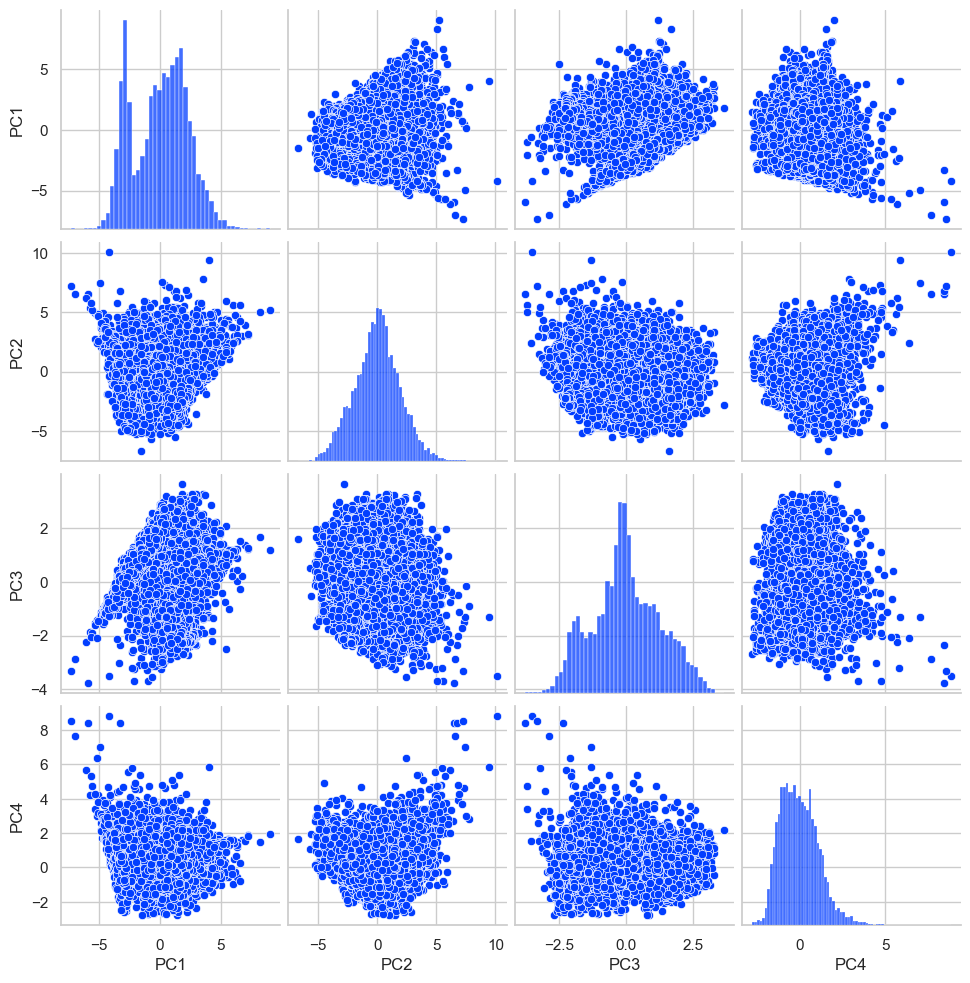

In [ ]:
# PCA 결과 시각화
plt.figure(figsize=(10,10))
sns.pairplot(pca_df)
plt.show()

### 보고서용

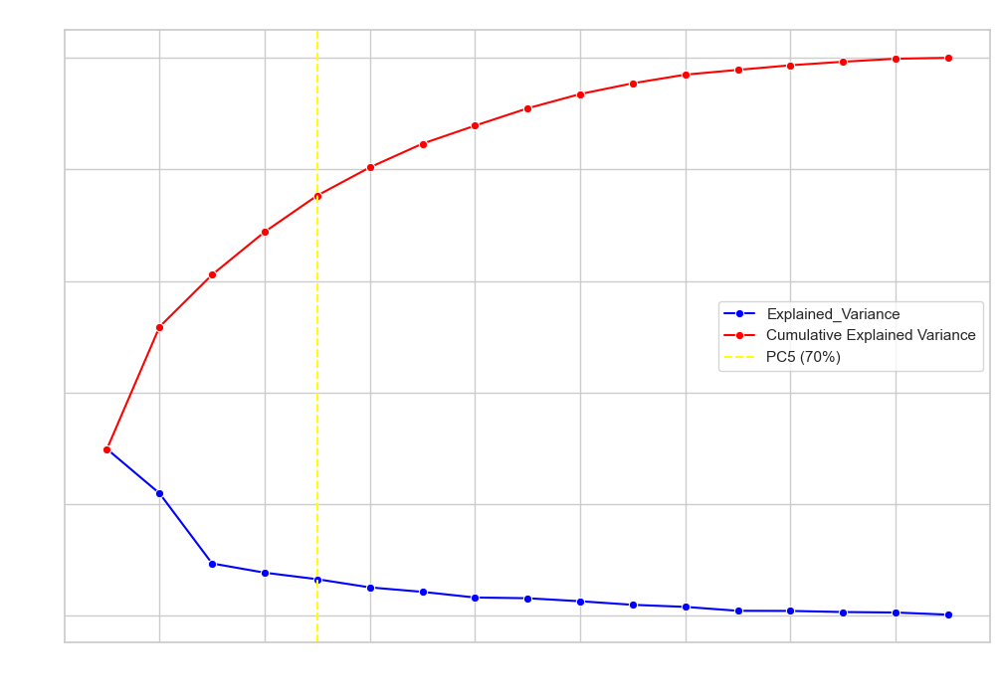

In [ ]:
# 시각화
plt.figure(figsize=(12, 8))
sns.lineplot(x=range(1, len(explained_variance_ratio) + 1), y=explained_variance_ratio,
             marker='o', label='Explained_Variance', color='blue')
sns.lineplot(x=range(1, len(cumulative_variance_ratio) + 1), y=cumulative_variance_ratio,
             marker='o', linestyle='-', color='red', label='Cumulative Explained Variance')

# 누적합이 70%에 도달하는 지점에 수직 파선 추가
threshold_index = np.argmax(cumulative_variance_ratio >= 0.7)  # 누적 설명력이 70% 이상이 되는 첫 번째 인덱스
plt.axvline(x=threshold_index + 1, color='Yellow', linestyle='--', label=f"PC{threshold_index + 1} (70%)")

# 축 및 제목 설정
plt.xlabel('Principal Component Number', color='white')  # 주성분번호
plt.ylabel('Explained Variance Ratio', color='white')  # 설명분산비율
plt.title('Explained Variance Ratio and Cumulative Explained Variance', color='white')  # 설명 분산 비율과 누적 설명 분산
plt.tick_params(colors='white')
plt.legend()
plt.grid(True)
# 투명 배경으로 저장
plt.savefig('plot_white_text.png', transparent=True)
plt.show()

___
# 엘보우매서드
___

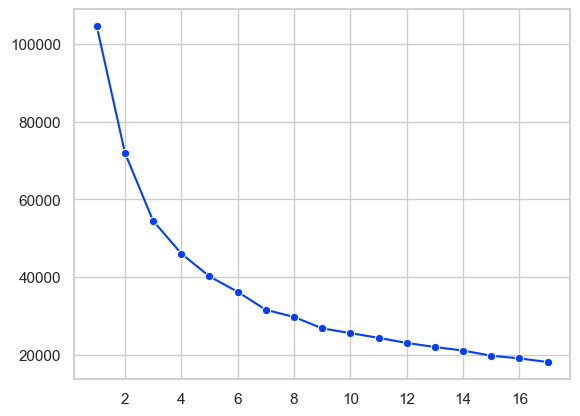

In [ ]:
from sklearn.cluster import KMeans

inertias = []

for k in range(1, 18):
    model = KMeans(n_clusters=k, random_state=123)
    model.fit(pca_df)
    inertias.append(model.inertia_)

sns.lineplot(x=range(1,18), y=inertias, marker='o')
plt.show()

### 보고서용

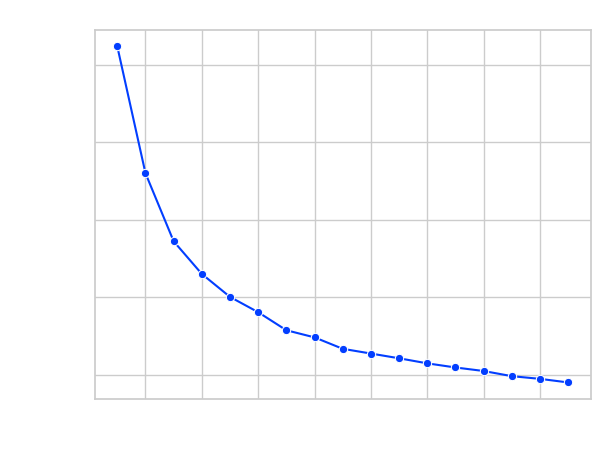

In [ ]:
sns.lineplot(x=range(1,18), y=inertias, marker='o')
plt.title('Elbow Method', color='white')  # 제목 추가
plt.xlabel('Number of Clusters', color='white')  # X축 라벨
plt.ylabel('Inertia', color='white')  # Y축 라벨
plt.tick_params(colors='white')  # 축 눈금 색상
plt.savefig('elbow_plot.png', transparent=True)
plt.show()

___
# k-means++ 적용
___

In [ ]:
model = KMeans(n_clusters=4, random_state=123, init='k-means++')  # 클러스터 개수 4개
model.fit(pca_df)


KMeans(n_clusters=4, random_state=123)

In [ ]:
pca_df['Cluster'] = model.labels_

In [ ]:
from sklearn.metrics import silhouette_score, silhouette_samples

silhouette_avg = silhouette_score(pca_df, pca_df['Cluster'])  # 전체 실루엣 점수
silhouette_values = silhouette_samples(pca_df, pca_df['Cluster'])  # 각 데이터 포인트의 실루엣 점수

print(f"Average Silhouette Score: {silhouette_avg}")
print(f"Silhouette Score: {silhouette_values}")


Average Silhouette Score: 0.35230627419969474
Silhouette Score: [0.15740709 0.57078723 0.32436579 ... 0.23871858 0.24978707 0.29317415]


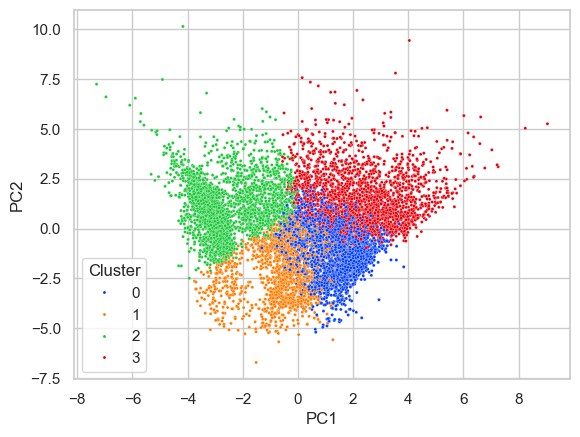

In [ ]:
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='bright',s=5)
plt.show()

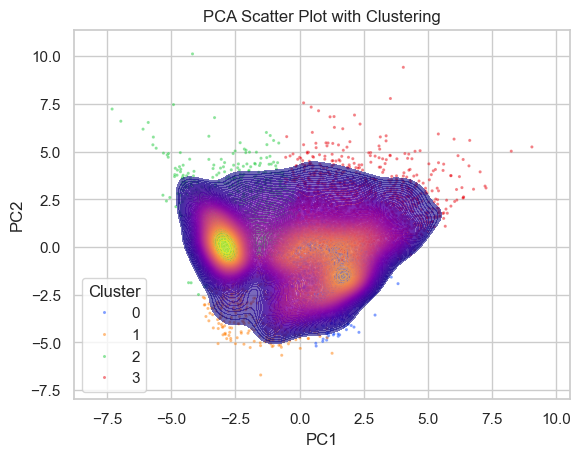

In [ ]:
# 클러스터링 결과 시각화 (PC1,PC2)

sns.scatterplot(
    x='PC1',
    y='PC2',
    hue='Cluster',
    data=pca_df,
    palette='bright',
    alpha=0.5,  # 산점도의 투명도
    s=5  # 점 크기 감소
)

sns.kdeplot(
    x=pca_df['PC1'],
    y=pca_df['PC2'],
    fill=True,
    cmap='plasma',
    alpha=0.6,  # 투명도를 낮춰 산점도가 보이도록 조정
    levels=100  # 밀도 계층
)

plt.title('PCA Scatter Plot with Clustering')
plt.show()

### 보고서용

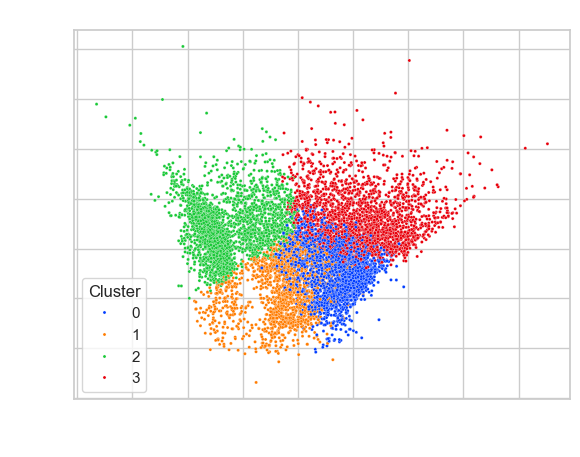

In [ ]:
# 보고서용
plt.figure(figsize=(6.4, 4.8))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=pca_df, palette='bright',s=5)
plt.title('PCA Scatter Plot with Clustering',color='white')
plt.xlabel("PC1", color='white')       # X축 라벨 색
plt.ylabel("PC2", color='white')       # Y축 라벨 색
plt.tick_params(colors='white')           # 축 눈금
plt.savefig('scatterplot.png', transparent=True)
plt.show()

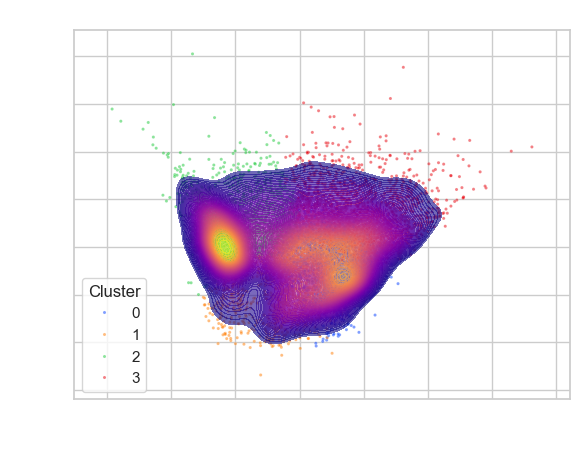

In [ ]:
# 보고서용
# 산점도 그리기
sns.scatterplot(
    x='PC1',
    y='PC2',
    hue='Cluster',
    data=pca_df,
    palette='bright',
    alpha=0.5,  # 산점도의 투명도
    s=5  # 점 크기 감소
)

sns.kdeplot(
    x=pca_df['PC1'],
    y=pca_df['PC2'],
    fill=True,
    cmap='plasma',
    alpha=0.6,  # 투명도를 낮춰 산점도가 보이도록 조정
    levels=100  # 밀도 계층
)

plt.title('PCA Scatter & kde plot with Clustering',color='white')
plt.xlabel("PC1", color='white')       # X축 라벨 색
plt.ylabel("PC2", color='white')       # Y축 라벨 색
plt.tick_params(colors='white')           # 축 눈금
plt.savefig('plot.png', transparent=True)
plt.show()

___
# 3D
___

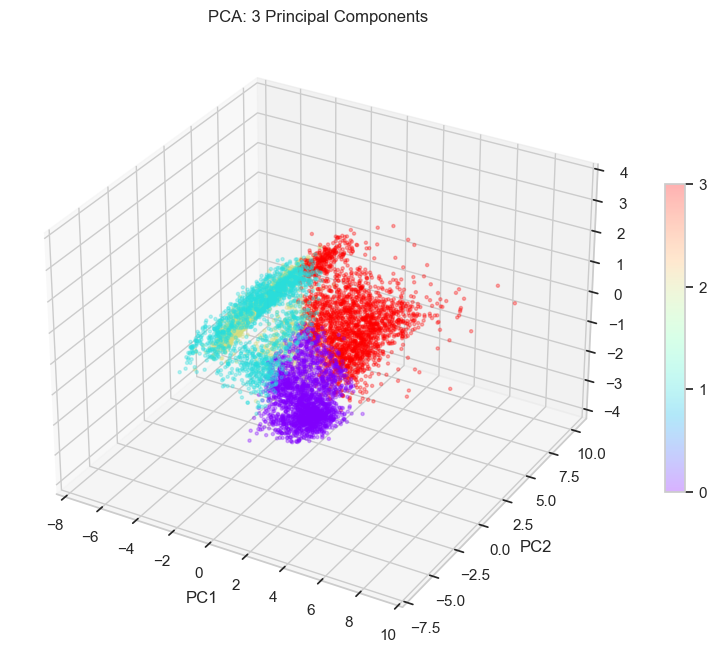

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# 3D 시각화
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# 산점도 생성
scatter = ax.scatter(
    pca_df['PC1'],
    pca_df['PC2'],
    pca_df['PC3'],
    alpha=0.3,
    s=5,
    c=pca_df['Cluster'],
    cmap='rainbow'
)

# 색상바 추가 (클러스터 레이블 역할)
colorbar = fig.colorbar(scatter, ax=ax, shrink=.5, aspect=15)
colorbar.set_ticks([0, 1, 2, 3])  # 눈금 설정

# 축 및 제목 설정
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_title("PCA: 3 Principal Components")

plt.show()


### 보고서용

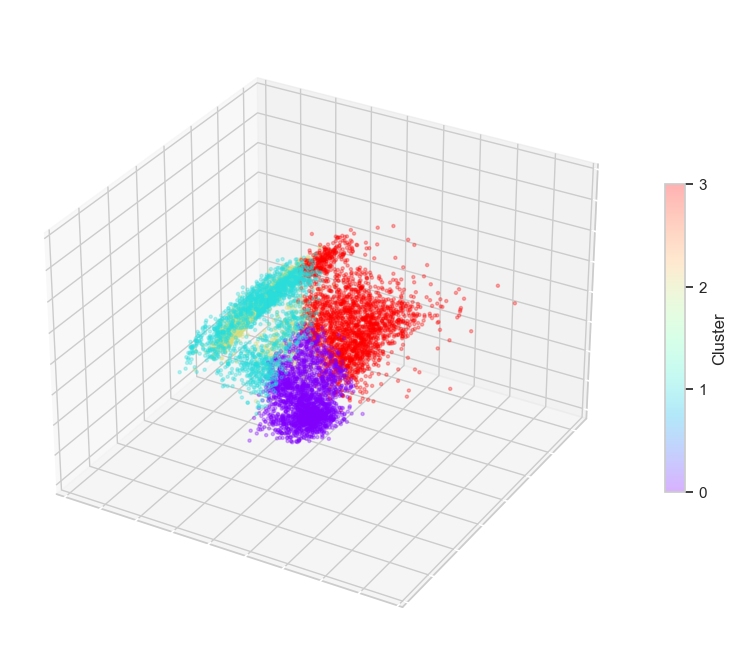

In [ ]:
# 보고서용
# 3D 시각화
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# 산점도 생성
scatter = ax.scatter(
    pca_df['PC1'],
    pca_df['PC2'],
    pca_df['PC3'],
    alpha=0.3,
    s=5,
    c=pca_df['Cluster'],
    cmap='rainbow'
)

# 색상바 추가 (클러스터 레이블 역할)
colorbar = fig.colorbar(scatter, ax=ax, shrink=.5, aspect=15)
colorbar.set_label("Cluster")
colorbar.set_ticks([0, 1, 2, 3])  # 눈금 설정

# 축 및 제목 설정
ax.set_xlabel("PC1", color='white')
ax.set_ylabel("PC2", color='white')
ax.set_title("PCA: 3 Principal Components",color='white')
plt.tick_params(colors='white')           # 축 눈금
plt.savefig('3d plot.png', transparent=True)
plt.show()

___
# 클러스터 특성 분석
___

In [ ]:
# 원본 데이터에 클러스터 번호 부여
for_analysis = deepcopy(data)
for_analysis['cluster'] = model.labels_
for_analysis['cluster'].dtypes
for_analysis.head(3)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.0,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.0,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.0,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12,3


In [ ]:
for_analysis.groupby('cluster')['CUST_ID'].count()


cluster
0    2184
1    1754
2    2783
3    2229
Name: CUST_ID, dtype: int64

이용자 수가 1번클러스터가 가장 많음
___

In [ ]:
# 숫자형 데이터만 선택
numeric_data = for_analysis.select_dtypes(include=['float64', 'int64'])

# 클러스터별로 평균
cluster_means = numeric_data.groupby(for_analysis['cluster']).mean()

for_heatmap = cluster_means.reset_index()
for_heatmap


,cluster,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0,510.067416,0.892556,647.960288,63.546177,585.360806,128.357657,0.807502,0.041413,0.756806,0.025557,0.459707,14.108059,2902.142880,809.447786,603.156137,0.276097,11.447344
1,1,331.990646,0.608032,389.278409,343.193843,46.340200,174.334845,0.226448,0.154392,0.069277,0.030957,0.531927,3.844926,3624.050136,858.843832,221.355584,0.152325,11.352908
2,2,2617.538832,0.951383,151.730316,116.596011,35.178024,2314.519913,0.102486,0.054650,0.046553,0.315898,7.759612,1.842975,4526.400004,1866.505115,1190.381526,0.027292,11.398132
3,3,2252.642580,0.981626,2897.477878,1900.888703,996.611157,777.690039,0.871533,0.582618,0.609144,0.098826,2.487663,39.913863,6698.964975,3159.671465,1141.109501,0.192741,11.864065


In [ ]:
cluster_means

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
cluster,,,,,,,,,,,,,,,,,
0,510.067416,0.892556,647.960288,63.546177,585.360806,128.357657,0.807502,0.041413,0.756806,0.025557,0.459707,14.108059,2902.142880,809.447786,603.156137,0.276097,11.447344
1,331.990646,0.608032,389.278409,343.193843,46.340200,174.334845,0.226448,0.154392,0.069277,0.030957,0.531927,3.844926,3624.050136,858.843832,221.355584,0.152325,11.352908
2,2617.538832,0.951383,151.730316,116.596011,35.178024,2314.519913,0.102486,0.054650,0.046553,0.315898,7.759612,1.842975,4526.400004,1866.505115,1190.381526,0.027292,11.398132
3,2252.642580,0.981626,2897.477878,1900.888703,996.611157,777.690039,0.871533,0.582618,0.609144,0.098826,2.487663,39.913863,6698.964975,3159.671465,1141.109501,0.192741,11.864065


In [ ]:
cluster_max = numeric_data.groupby(for_analysis['cluster']).max()
cluster_max


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
cluster,,,,,,,,,,,,,,,,,
0,8115.039014,1.0,12375.00,2501.00,12375.0,7663.906258,1.0,1.0,1.000000,0.714286,15,111,21500.0,15246.11594,38512.124770,1.0,12
1,3605.714046,1.0,4562.69,4562.69,1800.0,7155.612737,1.0,1.0,0.833333,0.500000,23,60,23000.0,34107.07499,3396.356156,1.0,12
2,16304.889250,1.0,22101.78,22101.78,3000.0,47137.211760,1.0,1.0,1.000000,1.500000,123,40,19600.0,39461.96580,61031.618600,1.0,12
3,19043.138560,1.0,49039.57,40761.25,22500.0,29282.109150,1.0,1.0,1.000000,1.000000,62,358,30000.0,50721.48336,76406.207520,1.0,12


In [ ]:
cluster_min = numeric_data.groupby(for_analysis['cluster']).min()
cluster_min

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
cluster,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,12.0,0.0,9.65,0.0,0.083333,0.0,0.083333,0.0,0,0,300.0,0.0,0.261984,0.0,6
1,0.000000,0.000000,0.0,0.0,0.00,0.0,0.000000,0.0,0.000000,0.0,0,0,150.0,0.0,0.019163,0.0,6
2,21.542924,0.181818,0.0,0.0,0.00,0.0,0.000000,0.0,0.000000,0.0,0,0,50.0,0.0,19.492021,0.0,6
3,12.423203,0.272727,8.4,0.0,0.00,0.0,0.090909,0.0,0.000000,0.0,0,2,500.0,0.0,41.854466,0.0,6


In [ ]:
cluster_median = numeric_data.groupby(for_analysis['cluster']).median()
cluster_median

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
cluster,,,,,,,,,,,,,,,,,
0,132.139578,1.000000,459.59,0.00,405.725,0.000000,0.916667,0.000000,0.833333,0.00,0.0,12.0,2000.0,554.310025,176.902214,0.083333,12.0
1,75.025987,0.571429,178.49,114.00,0.000,0.000000,0.166667,0.083333,0.000000,0.00,0.0,2.0,2500.0,383.070268,164.416452,0.000000,12.0
2,1822.259235,1.000000,0.00,0.00,0.000,1479.440572,0.000000,0.000000,0.000000,0.25,5.0,0.0,3000.0,954.718474,609.884322,0.000000,12.0
3,1396.625608,1.000000,1967.86,1141.55,576.820,0.000000,1.000000,0.583333,0.666667,0.00,0.0,28.0,6000.0,2006.417008,464.932133,0.000000,12.0


In [ ]:
result = for_analysis.groupby('cluster')['ONEOFF_PURCHASES'].agg(
    count='count',
    mean='mean',
    std='std',
    min='min',
    q1=lambda x: x.quantile(0.25),
    median=lambda x: x.median(),
    q3=lambda x: x.quantile(0.75),
    max='max'
)
result


,count,mean,std,min,q1,median,q3,max
cluster,,,,,,,,
0,2184,63.546177,178.259180,0.0,0.00,0.00,0.000,2501.00
1,1754,343.193843,540.723123,0.0,0.00,114.00,460.045,4562.69
2,2783,116.596011,526.026242,0.0,0.00,0.00,45.650,22101.78
3,2229,1900.888703,2853.284019,0.0,568.66,1141.55,2229.420,40761.25


| **지표**                      | **클러스터 0**          | **클러스터 1**           | **클러스터 2**            | **클러스터 3**            |
|-------------------------------|-------------------------|--------------------------|---------------------------|---------------------------|
| **잔액 (BALANCE)**            | 낮음 (660.28)          | 매우 높음 (2451.96)      | 매우 낮음 (115.32)        | 매우 높음 (2172.87)      |
| **잔액갱신빈도 (BALANCE_FREQUENCY)** | 중간 (0.94)            | 중간 (0.94)             | 낮음 (0.50)               | 높음 (0.98)              |
| **구매금액 (PURCHASES)**      | 중간 (692.73)          | 낮음 (167.28)           | 낮음 (361.17)            | 매우 높음 (2910.49)      |
| **일회성구매금액 (ONEOFF_PURCHASES)** | 낮음 (74.76)    | 낮음 (135.94)           | 중간 (265.59)            | 매우 높음 (1946.45)      |
| **할부구매금액 (INSTALLMENTS_PURCHASES)** | 중간 (618.96) | 매우 낮음 (31.41)       | 낮음 (95.81)             | 매우 높음 (964.07)       |
| **현금서비스금액 (CASH_ADVANCE)** | 낮음 (166.55)          | 매우 높음 (2105.92)     | 낮음 (119.47)            | 높음 (758.39)            |
| **구매빈도 (PURCHASES_FREQUENCY)** | 높음 (0.81)            | 낮음 (0.11)            | 중간 (0.29)              | 매우 높음 (0.86)         |
| **일회성구매빈도 (ONEOFF_PURCHASES_FREQUENCY)** | 매우 낮음 (0.05) | 낮음 (0.06) | 낮음 (0.12)            | 높음 (0.60)              |
| **할부구매빈도 (PURCHASES_INSTALLMENTS_FREQUENCY)** | 높음 (0.76) | 매우 낮음 (0.04) | 낮음 (0.16)         | 중간 (0.58)              |
| **현금서비스빈도 (CASH_ADVANCE_FREQUENCY)** | 낮음 (0.03)    | 중간 (0.29)            | 매우 낮음 (0.02)         | 낮음 (0.10)              |
| **현금서비스횟수 (CASH_ADVANCE_TRX)** | 중간 (0.58)    | 매우 높음 (7.04)       | 낮음 (0.40)             | 낮음 (2.42)              |
| **구매횟수 (PURCHASES_TRX)**   | 중간 (14.86)           | 낮음 (1.95)            | 낮음 (4.32)              | 매우 높음 (39.61)        |
| **신용한도 (CREDIT_LIMIT)**    | 낮음 (2997.16)         | 높음 (4399.43)          | 중간 (3540.07)           | 매우 높음 (6698.71)      |
| **납입금액 (PAYMENTS)**        | 중간 (880.68)          | 낮음 (729.52)           | 낮음 (729.52)            | 매우 높음 (3145.09)      |
| **최소납입금 (MINIMUM_PAYMENTS)** | 중간 (727.23)          | 높음 (1125.59)          | 낮음 (152.95)            | 높음 (1039.31)           |
| **완납비율 (PRC_FULL_PAYMENT)** | 낮음 (0.24)            | 매우 낮음 (0.03)        | 낮음 (0.22)              | 낮음 (0.20)              |
| **사용기간 (TENURE)**          | 높음 (11.53)           | 중간 (11.43)            | 중간 (11.18)             | 높음 (11.85)             |


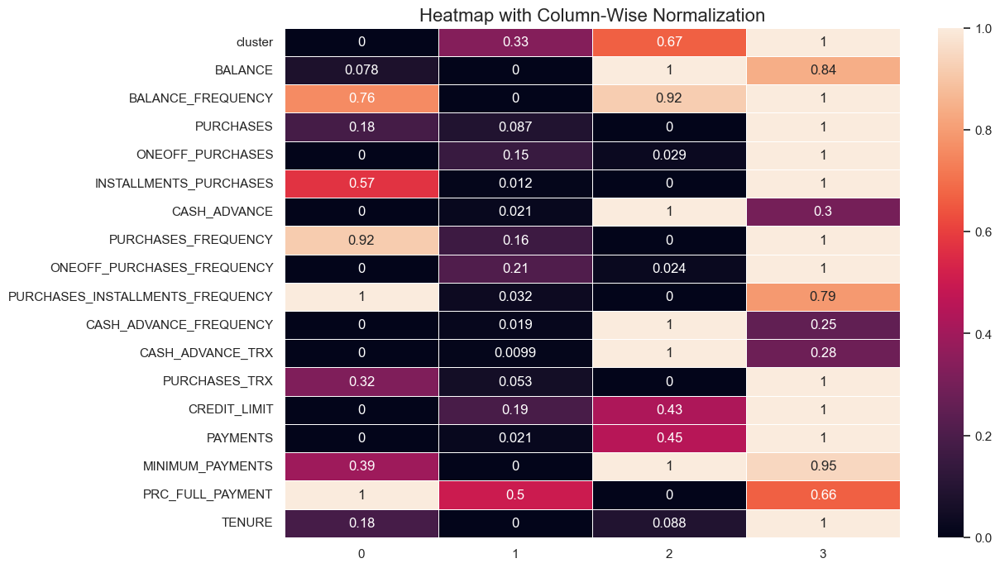

In [ ]:
# 열별 Min-Max 정규화
for_heatmap_normalized = for_heatmap.apply(
    lambda x: (x - x.min()) / (x.max() - x.min()), axis=0
)

# 히트맵 생성
plt.figure(figsize=(12, 8))
sns.heatmap(
    data=for_heatmap_normalized.T,
    annot=True,
    linewidths=0.5
)
plt.title("Heatmap with Column-Wise Normalization", fontsize=16)
plt.show()


### 보고서용

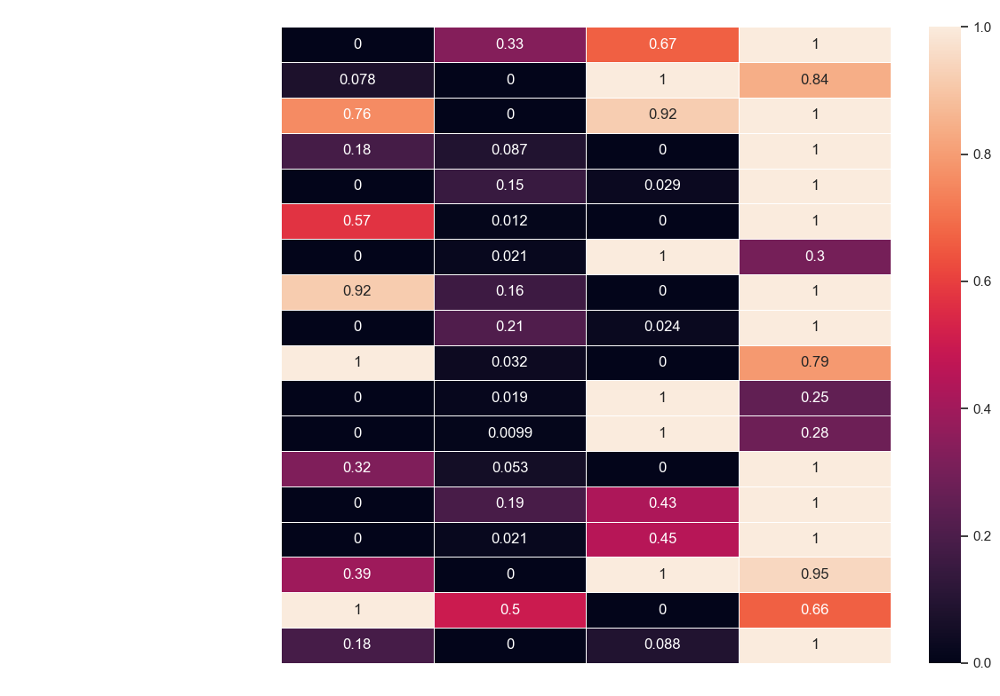

In [ ]:
# 열별 Min-Max 정규화
for_heatmap_normalized = for_heatmap.apply(
    lambda x: (x - x.min()) / (x.max() - x.min()), axis=0
)

# 히트맵 생성
plt.figure(figsize=(12, 8))
sns.heatmap(
    data=for_heatmap_normalized.T,
    annot=True,
    linewidths=0.5
)

# 축 및 제목 설정
plt.title("Heatmap with Column-Wise Normalization",color='white')
plt.tick_params(colors='white')
plt.yticks(fontsize=10, rotation=0)
plt.tight_layout()
plt.savefig('for_heatmap_normalized.png', transparent=True)

plt.show()



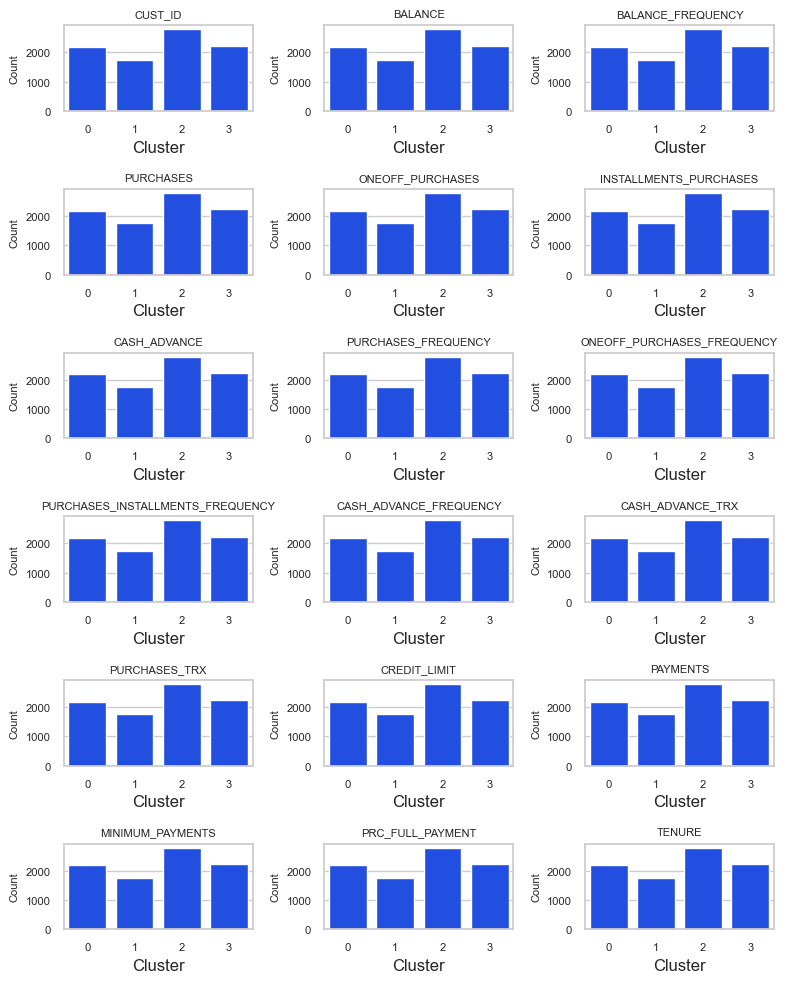

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(8, 10))  # 17개
axes = axes.flatten()

for i, col in enumerate(for_analysis.columns):  # 각 열에 대해서
    if col != 'cluster':  # 클러스터는 제외하고
        ax = axes[i]
        sns.countplot(x='cluster', data=for_analysis, ax=ax)  # 클러스터별 데이터 개수
        ax.set_title(col, fontsize=8)
        ax.set_xlabel("Cluster", )
        ax.set_ylabel("Count", fontsize=8)
        ax.tick_params(axis='x', labelsize=8)  # x축 숫자 폰트 크기
        ax.tick_params(axis='y', labelsize=8)  # y축 숫자 폰트 크기

plt.tight_layout()
plt.show()


In [ ]:
px.scatter(for_analysis.sort_values(by='cluster', ascending=False),
           x='BALANCE', y='cluster', color='BALANCE')

In [ ]:
for_analysis.head()


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,3
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.343947,0.000000,12,1
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1


In [ ]:

for col in for_analysis.columns:
    if col != 'cluster':
        fig = px.scatter(for_analysis,
                         x=col,
                         y='cluster',
                         color='BALANCE',
                         title=f'Clustered {col} by Balance',
                         labels={col: col, 'cluster': 'Cluster', 'BALANCE': 'Balance'})
        fig.show()


In [ ]:
all_corr = for_analysis[numeric_columns].corr()

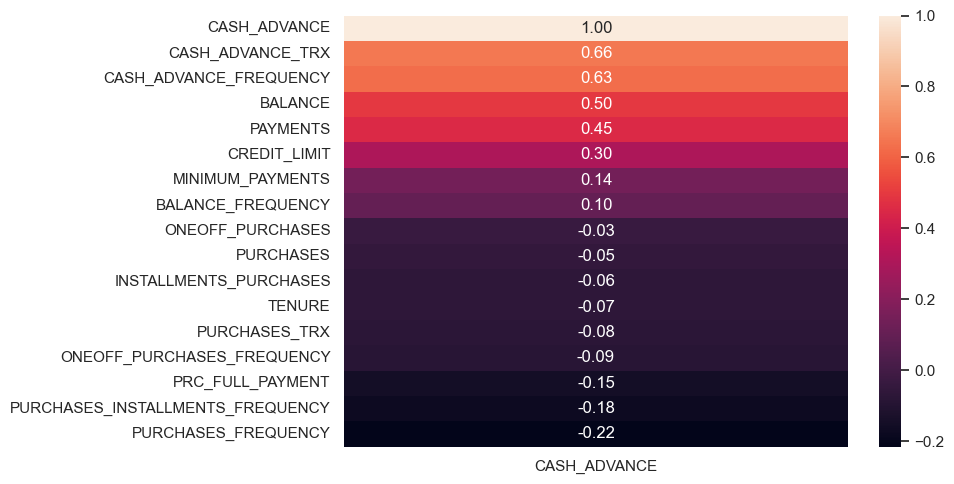

In [ ]:
all_corr = all_corr.sort_values(by='CASH_ADVANCE',ascending=False)
all_corr = all_corr.sort_values(by='CASH_ADVANCE',ascending=False, axis=1)
plt.figure(figsize=(10,5))
sns.heatmap(all_corr[:1].T, annot=True, fmt='.2f')
plt.tight_layout()
plt.show()

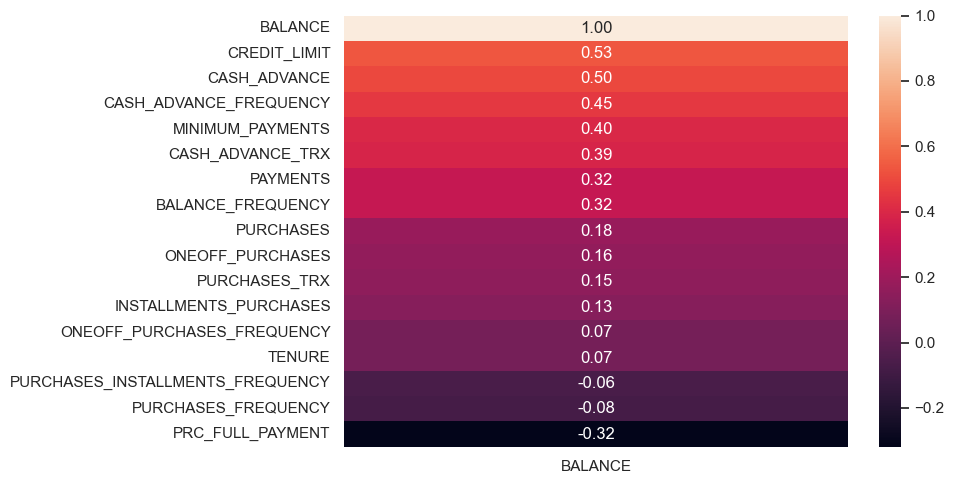

In [ ]:
all_corr = all_corr.sort_values(by='BALANCE',ascending=False)
all_corr = all_corr.sort_values(by='BALANCE',ascending=False, axis=1)
plt.figure(figsize=(10,5))
sns.heatmap(all_corr[:1].T, annot=True, fmt='.2f')
plt.tight_layout()
plt.show()

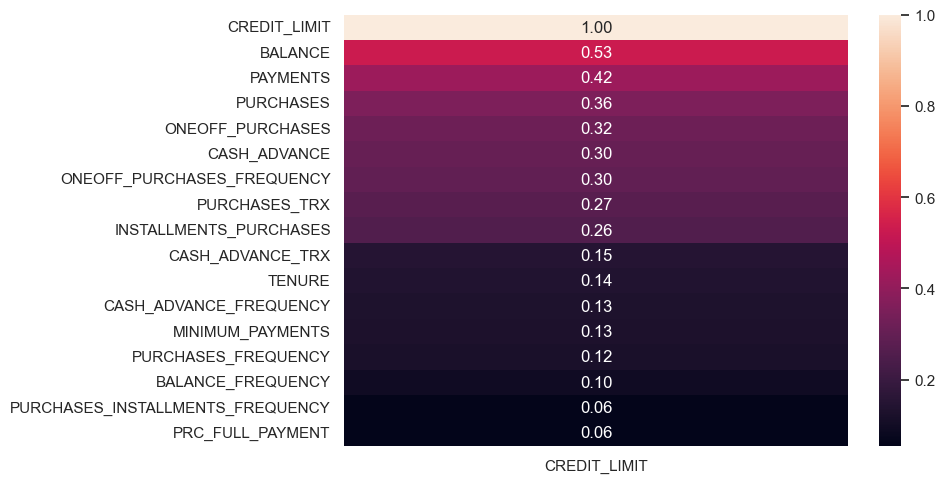

In [ ]:
all_corr = all_corr.sort_values(by='CREDIT_LIMIT',ascending=False)
all_corr = all_corr.sort_values(by='CREDIT_LIMIT',ascending=False, axis=1)
plt.figure(figsize=(10,5))
sns.heatmap(all_corr[:1].T, annot=True, fmt='.2f')
plt.tight_layout()
plt.show()

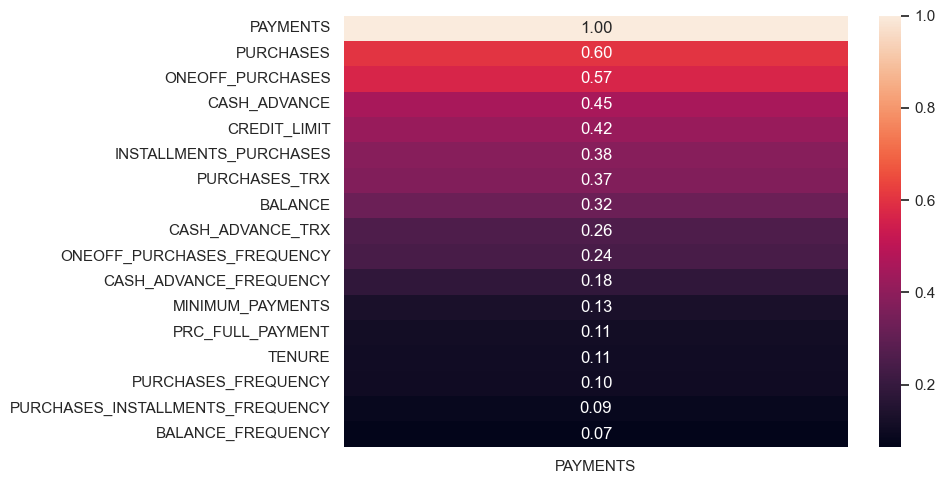

In [ ]:
all_corr = all_corr.sort_values(by='PAYMENTS',ascending=False)
all_corr = all_corr.sort_values(by='PAYMENTS',ascending=False, axis=1)
plt.figure(figsize=(10,5))
sns.heatmap(all_corr[:1].T, annot=True, fmt='.2f')
plt.tight_layout()
plt.show()

# 고객 유형별 분석
___
클러스터 0 : 저잔액 고소비 일반 고객  
클러스터 1 : 고잔액 저소비 현금서비스 고객  
클러스터 2 : 저잔액 저소비 비활동 고객  
클러스터 3 : 고잔액 고소비 VIP 고객
___

- 전체분포확인

In [ ]:
for_analysis2 = deepcopy(standardized_data)
for_analysis2['cluster'] = for_analysis['cluster']

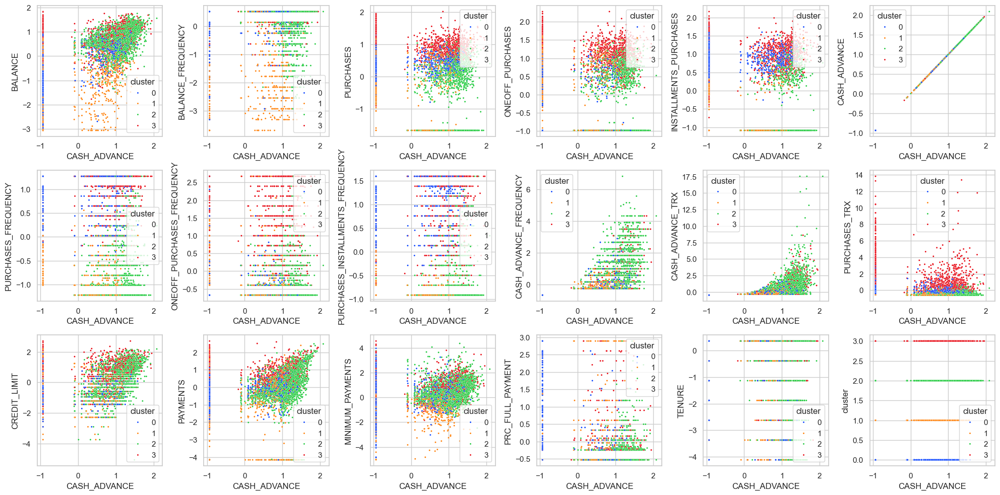

In [ ]:

fig, axes = plt.subplots(3, 6, figsize=(20, 10))
axes = axes.flatten()  # 2D 배열을 1D로 변환

for col, ax in zip(for_analysis2.columns, axes):
    sns.scatterplot(x='CASH_ADVANCE', y=col, data=for_analysis2, ax=ax, hue='cluster',s=5, palette='bright')


# 레이아웃 조정
plt.tight_layout()
plt.show()


# 1. 안정형 고객 (물건을 많이 삼, 현금서비스 이용률, 잔액은 그렇게 많진않음)

In [ ]:
steady_cust = for_analysis[for_analysis['cluster']==0]
steady_cust

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
5,C10006,1809.828751,1.000000,1333.28,0.0,1333.28,0.0,0.666667,0.0,0.583333,0.0,0,8,1800.0,1400.057770,2407.246035,0.00,12,0
7,C10008,1823.652743,1.000000,436.20,0.0,436.20,0.0,1.000000,0.0,1.000000,0.0,0,12,2300.0,679.065082,532.033990,0.00,12,0
10,C10011,1293.124939,1.000000,920.12,0.0,920.12,0.0,1.000000,0.0,1.000000,0.0,0,12,1200.0,1083.301007,2172.697765,0.00,12,0
19,C10020,3577.970933,1.000000,398.64,0.0,398.64,0.0,1.000000,0.0,1.000000,0.0,0,12,4000.0,1053.980464,12465.549380,0.00,12,0
20,C10021,2016.684686,1.000000,176.68,0.0,176.68,0.0,0.666667,0.0,0.666667,0.0,0,8,2000.0,223.068600,13557.297260,0.00,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8940,C19181,130.838554,1.000000,591.24,0.0,591.24,0.0,1.000000,0.0,0.833333,0.0,0,6,1000.0,475.523262,82.771320,1.00,6,0
8942,C19183,40.829749,1.000000,113.28,0.0,113.28,0.0,1.000000,0.0,0.833333,0.0,0,6,1000.0,94.488828,86.283101,0.25,6,0
8945,C19186,28.493517,1.000000,291.12,0.0,291.12,0.0,1.000000,0.0,0.833333,0.0,0,6,1000.0,325.594462,48.886365,0.50,6,0
8946,C19187,19.183215,1.000000,300.00,0.0,300.00,0.0,1.000000,0.0,0.833333,0.0,0,6,1000.0,275.861322,312.343947,0.00,6,0


### 할부횟수와 구매액

<Axes: xlabel='INSTALLMENTS_PURCHASES', ylabel='PURCHASES'>

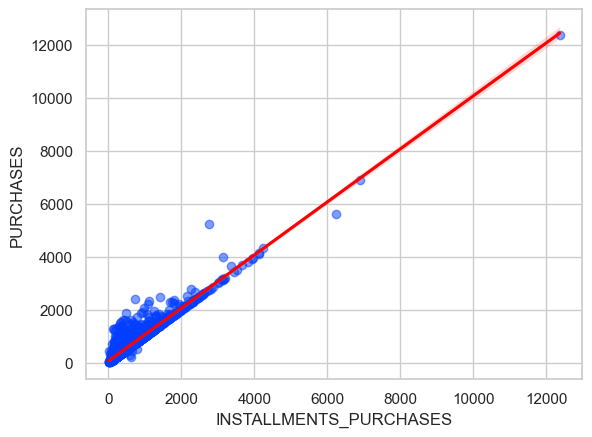

In [ ]:
# 산점도와 추세선을 함께 표시
sns.regplot(x='INSTALLMENTS_PURCHASES', y='PURCHASES', data=steady_cust, line_kws={"color": "red"}, scatter_kws={"alpha": 0.5})


In [ ]:
data = steady_cust

# 독립변수(X)와 종속변수(Y) 분리
X = data['INSTALLMENTS_PURCHASES']  # 독립변수
Y = data['PURCHASES']  # 종속변수

# 상수항 추가 (절편을 포함한 회귀식을 생성하기 위해 필요)
X = sm.add_constant(X)

# 회귀모델 생성 및 적합
model = sm.OLS(Y, X).fit()

# 결과 출력
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              PURCHASES   R-squared:                       0.924
Model:                            OLS   Adj. R-squared:                  0.924
Method:                 Least Squares   F-statistic:                 2.665e+04
Date:                Wed, 11 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:47:01   Log-Likelihood:                -14434.
No. Observations:                2184   AIC:                         2.887e+04
Df Residuals:                    2182   BIC:                         2.888e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     61

#### 보고서용

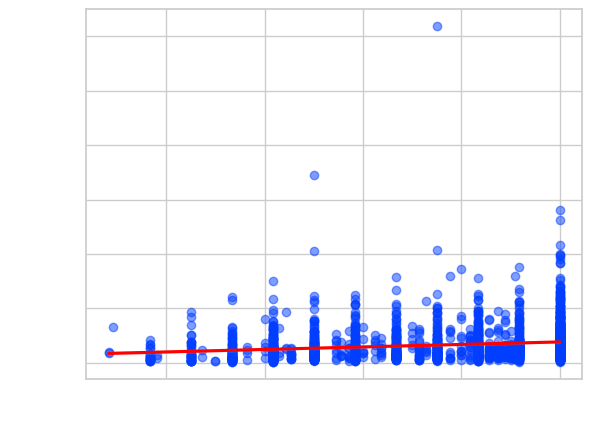

In [ ]:
# 산점도와 추세선을 함께 표시
sns.regplot(x='PURCHASES_INSTALLMENTS_FREQUENCY', y='PURCHASES', data=steady_cust, line_kws={"color": "red"}, scatter_kws={"alpha": 0.5})

plt.xlabel("PURCHASES_INSTALLMENTS_FREQUENCY", color='white')
plt.ylabel("PURCHASES", color='white')
plt.title("",color='white')
plt.tick_params(colors='white')           # 축 눈금
plt.savefig('PURCHASES_INSTALLMENTS_FREQUENCY_PURCHASES.png', transparent=True)
plt.show()

## 할부금액과 신용

<Axes: xlabel='INSTALLMENTS_PURCHASES', ylabel='CREDIT_LIMIT'>

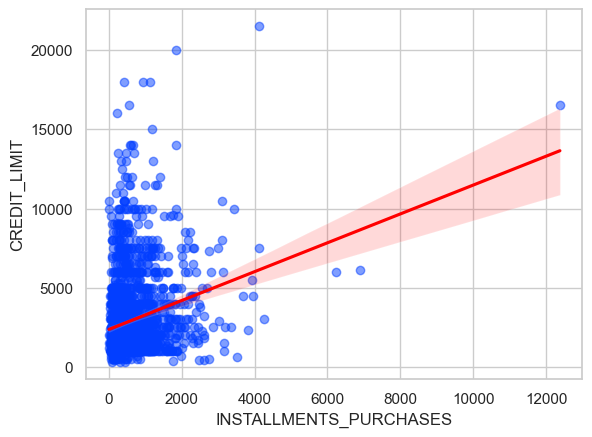

In [ ]:
# 산점도와 추세선을 함께 표시
sns.regplot(x='INSTALLMENTS_PURCHASES', y='CREDIT_LIMIT', data=steady_cust, line_kws={"color": "red"}, scatter_kws={"alpha": 0.5})

In [ ]:
data = steady_cust

# 독립변수(X)와 종속변수(Y) 분리
X = data['INSTALLMENTS_PURCHASES']  # 독립변수
Y = data['CREDIT_LIMIT']  # 종속변수

# 상수항 추가 (절편을 포함한 회귀식을 생성하기 위해 필요)
X = sm.add_constant(X)

# 회귀모델 생성 및 적합
model = sm.OLS(Y, X).fit()

# 결과 출력
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           CREDIT_LIMIT   R-squared:                       0.054
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     124.6
Date:                Wed, 11 Dec 2024   Prob (F-statistic):           3.57e-28
Time:                        18:38:10   Log-Likelihood:                -20086.
No. Observations:                2184   AIC:                         4.018e+04
Df Residuals:                    2182   BIC:                         4.019e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                   2368

다중공선성문제로 인해 로그로..

<Axes: xlabel='INSTALLMENTS_PURCHASES', ylabel='CREDIT_LIMIT'>

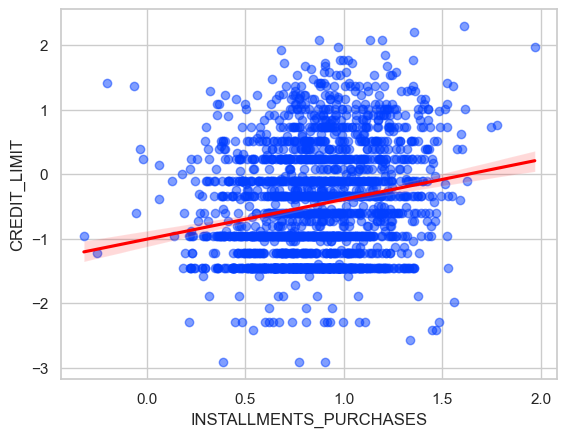

In [ ]:
steady_cust2 = for_analysis2[for_analysis2['cluster']==0]

# 산점도와 추세선을 함께 표시
sns.regplot(x='INSTALLMENTS_PURCHASES', y='CREDIT_LIMIT', data=steady_cust2, line_kws={"color": "red"}, scatter_kws={"alpha": 0.5})

In [ ]:
data = steady_cust2

# 독립변수(X)와 종속변수(Y) 분리
X = data['INSTALLMENTS_PURCHASES']  # 독립변수
Y = data['CREDIT_LIMIT']  # 종속변수

# 상수항 추가 (절편을 포함한 회귀식을 생성하기 위해 필요)
X = sm.add_constant(X)

# 회귀모델 생성 및 적합
model = sm.OLS(Y, X).fit()

# 결과 출력
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           CREDIT_LIMIT   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                  0.039
Method:                 Least Squares   F-statistic:                     89.30
Date:                Wed, 11 Dec 2024   Prob (F-statistic):           8.42e-21
Time:                        18:40:41   Log-Likelihood:                -2719.4
No. Observations:                2184   AIC:                             5443.
Df Residuals:                    2182   BIC:                             5454.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -1

### 보고서용

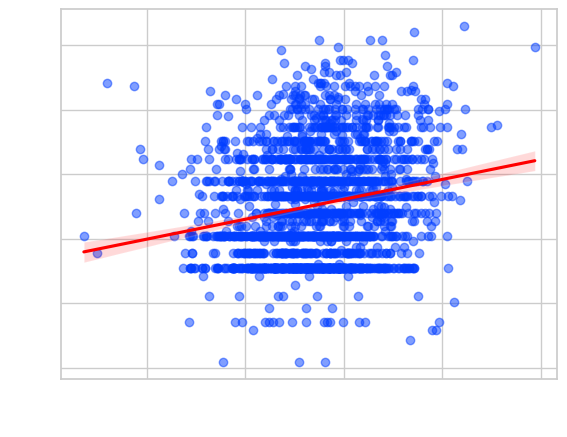

In [ ]:
# 산점도와 추세선을 함께 표시
sns.regplot(x='INSTALLMENTS_PURCHASES', y='CREDIT_LIMIT', data=steady_cust2, line_kws={"color": "red"}, scatter_kws={"alpha": 0.5})

plt.xlabel("INSTALLMENTS_PURCHASES", color='white')
plt.ylabel("CREDIT_LIMIT", color='white')
plt.title("",color='white')
plt.tick_params(colors='white')           # 축 눈금
plt.savefig('INSTALLMENTS_PURCHASES_CREDIT_LIMIT.png', transparent=True)
plt.show()

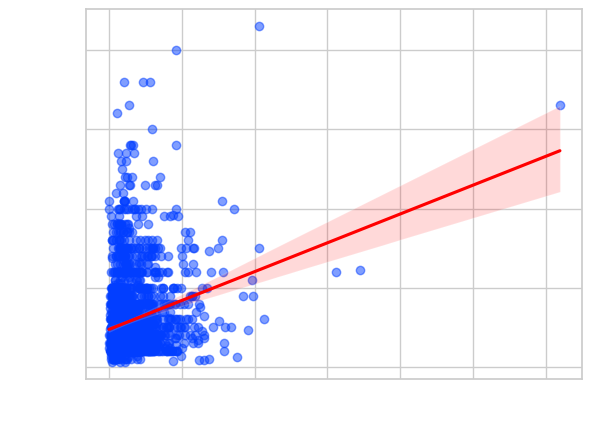

In [ ]:
# 산점도와 추세선을 함께 표시
sns.regplot(x='INSTALLMENTS_PURCHASES', y='CREDIT_LIMIT', data=steady_cust, line_kws={"color": "red"}, scatter_kws={"alpha": 0.5})

plt.xlabel("INSTALLMENTS_PURCHASES", color='white')
plt.ylabel("CREDIT_LIMIT", color='white')
plt.title("",color='white')
plt.tick_params(colors='white')           # 축 눈금
plt.savefig('INSTALLMENTS_PURCHASES_CREDIT_LIMIT.png', transparent=True)
plt.show()

___

## 신용과 결제액

<Axes: xlabel='CREDIT_LIMIT', ylabel='PURCHASES'>

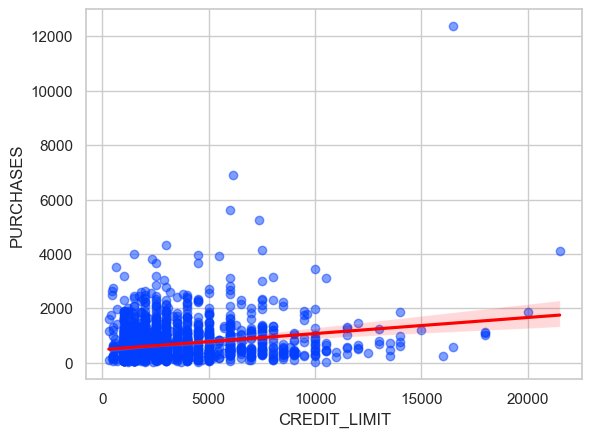

In [ ]:
# 산점도와 추세선을 함께 표시
sns.regplot(x='CREDIT_LIMIT', y='PURCHASES', data=steady_cust, line_kws={"color": "red"}, scatter_kws={"alpha": 0.5})

In [ ]:
data = steady_cust

# 독립변수(X)와 종속변수(Y) 분리
X = data['CREDIT_LIMIT']  # 독립변수
Y = data['PURCHASES']  # 종속변수

# 상수항 추가 (절편을 포함한 회귀식을 생성하기 위해 필요)
X = sm.add_constant(X)

# 회귀모델 생성 및 적합
model = sm.OLS(Y, X).fit()

# 결과 출력
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              PURCHASES   R-squared:                       0.049
Model:                            OLS   Adj. R-squared:                  0.049
Method:                 Least Squares   F-statistic:                     113.6
Date:                Wed, 11 Dec 2024   Prob (F-statistic):           6.99e-26
Time:                        18:34:56   Log-Likelihood:                -17198.
No. Observations:                2184   AIC:                         3.440e+04
Df Residuals:                    2182   BIC:                         3.441e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const          476.3661     21.090     22.587   

### 보고서용

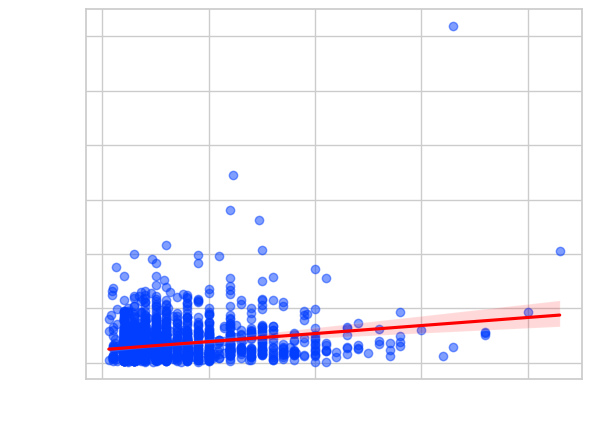

In [ ]:
# 산점도와 추세선을 함께 표시
sns.regplot(x='CREDIT_LIMIT', y='PURCHASES', data=steady_cust, line_kws={"color": "red"}, scatter_kws={"alpha": 0.5})
plt.xlabel("CREDIT_LIMIT", color='white')
plt.ylabel("PURCHASES", color='white')
plt.title("",color='white')
plt.tick_params(colors='white')           # 축 눈금
plt.savefig('ICREDIT_LIMIT_CREDIT_LIMIT.png', transparent=True)
plt.show()

___

# 2. 현금형 고객

In [ ]:
cash_cust = for_analysis[for_analysis['cluster']==1]
cash_cust

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.00,12,1
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.343947,0.00,12,1
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.00,12,1
9,C10010,152.225975,0.545455,1281.60,1281.60,0.0,0.000000,0.166667,0.166667,0.000000,0.000000,0,3,11000.0,1164.770591,100.302262,0.00,12,1
11,C10012,630.794744,0.818182,1492.18,1492.18,0.0,0.000000,0.250000,0.250000,0.000000,0.000000,0,6,2000.0,705.618627,155.549069,0.00,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8939,C19180,728.352548,1.000000,734.40,734.40,0.0,239.891038,0.333333,0.333333,0.000000,0.166667,2,2,1000.0,72.530037,110.950798,0.00,6,1
8943,C19184,5.871712,0.500000,20.90,20.90,0.0,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.00,6,1
8944,C19185,193.571722,0.833333,1012.73,1012.73,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,4000.0,0.000000,312.343947,0.00,6,1
8948,C19189,13.457564,0.833333,0.00,0.00,0.0,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.25,6,1


In [ ]:
cash_cust = cash_cust.sort_values(by='PURCHASES',ascending=False)
cash_cust.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
count,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.000000,1754.0
mean,331.990646,0.608032,389.278409,343.193843,46.340200,174.334845,0.226448,0.154392,0.069277,0.030957,0.531927,3.844926,3624.050136,858.843832,221.355584,0.152325,11.352908,1.0
std,544.613898,0.331618,537.317771,540.723123,108.833964,543.468268,0.200974,0.196790,0.126131,0.065008,1.452168,4.519579,3113.132764,1959.311935,245.260746,0.297077,1.532785,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,150.000000,0.000000,0.019163,0.000000,6.000000,1.0
25%,14.845130,0.300000,55.592500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1500.000000,164.474076,93.919439,0.000000,12.000000,1.0
50%,75.025987,0.571429,178.490000,114.000000,0.000000,0.000000,0.166667,0.083333,0.000000,0.000000,0.000000,2.000000,2500.000000,383.070268,164.416452,0.000000,12.000000,1.0
75%,387.048127,1.000000,504.515000,460.045000,48.390000,0.000000,0.333333,0.222222,0.083333,0.000000,0.000000,5.000000,5000.000000,851.850561,312.343947,0.142857,12.000000,1.0
max,3605.714046,1.000000,4562.690000,4562.690000,1800.000000,7155.612737,1.000000,1.000000,0.833333,0.500000,23.000000,60.000000,23000.000000,34107.074990,3396.356156,1.000000,12.000000,1.0


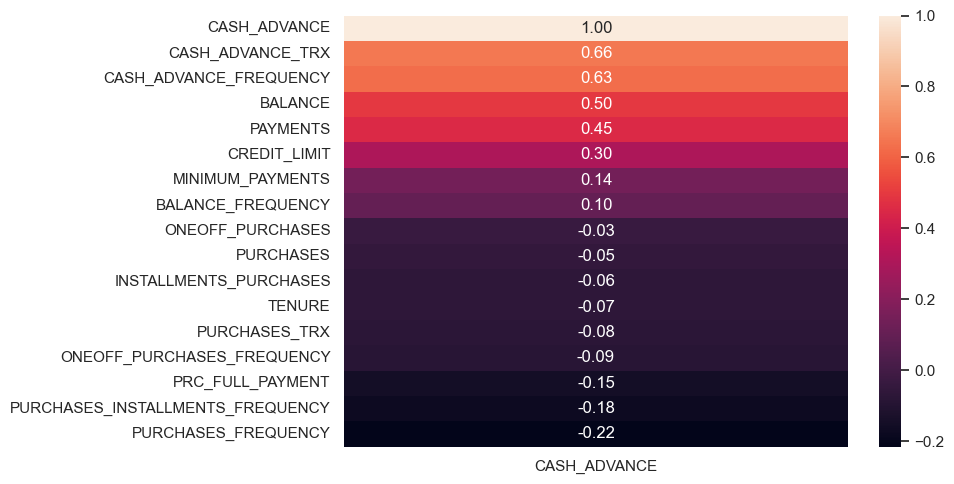

In [ ]:
all_corr = all_corr.sort_values(by='CASH_ADVANCE',ascending=False)
all_corr = all_corr.sort_values(by='CASH_ADVANCE',ascending=False, axis=1)
plt.figure(figsize=(10,5))
sns.heatmap(all_corr[:1].T, annot=True, fmt='.2f')
plt.tight_layout()
plt.show()

## 구매액 히트맵

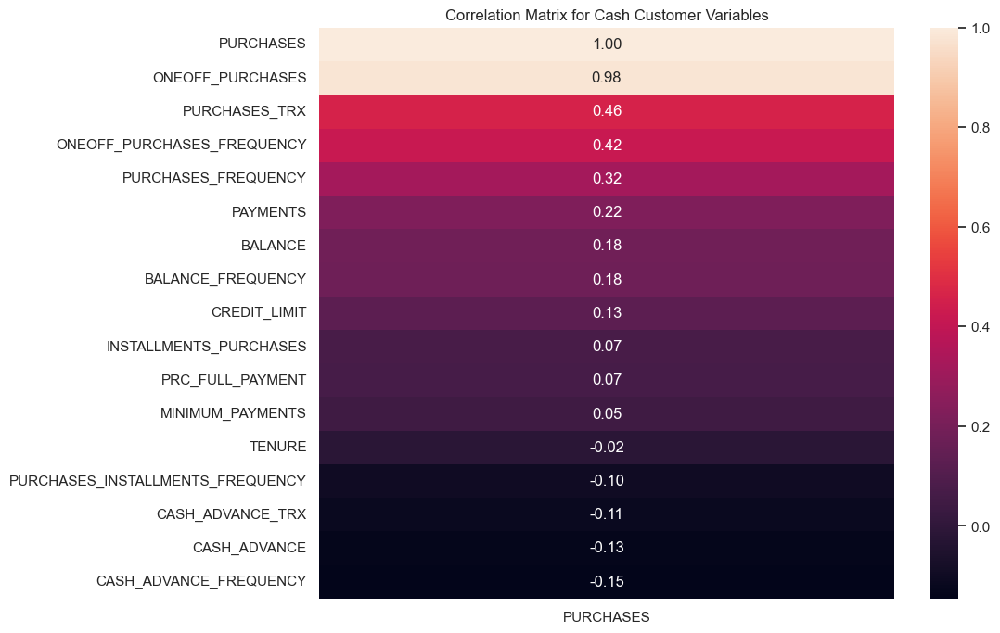

In [ ]:
correlation_matrix = cash_cust[numeric_columns].corr()
cash_cust_corr = correlation_matrix.sort_values(by='PURCHASES',ascending=False)
cash_cust_corr = correlation_matrix.sort_values(by='PURCHASES',ascending=False, axis=1)

plt.figure(figsize=(10,8))
sns.heatmap(cash_cust_corr[2:3].T, annot=True, fmt='.2f')
plt.title("Correlation Matrix for Cash Customer Variables")
plt.show()

### 보고서용

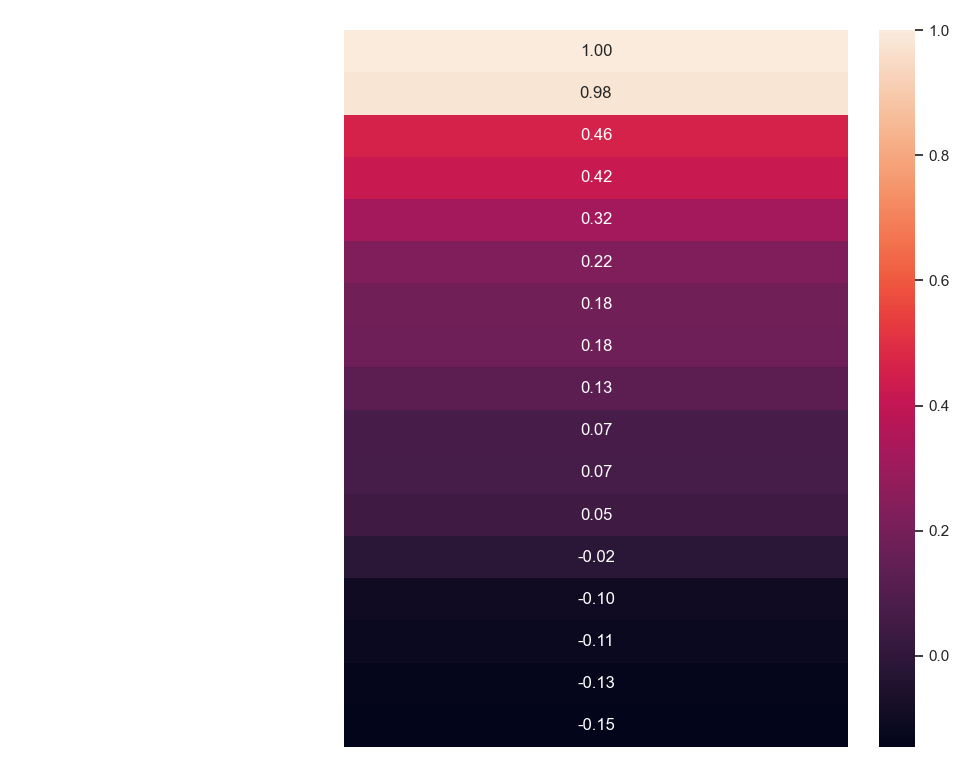

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(cash_cust_corr[2:3].T, annot=True, fmt='.2f')
plt.title("Correlation Matrix for Cash Customer Variables", color='white')
plt.tick_params(colors='white')           # 축 눈금
plt.tight_layout()
plt.savefig('Correlation Matrix for Cash Customer Variables heatmap.png', transparent=True)
plt.show()

현금형 고객은 일회성 구매액과 총 구매액과의 관련도가 엄청높음(할부도 잘안함)
___


## 일회성 구매와 구매액

In [ ]:
data = cash_cust

# 독립변수(X)와 종속변수(Y) 분리
X = data[['ONEOFF_PURCHASES','PURCHASES_TRX']]  # 독립변수
Y = data['PURCHASES']  # 종속변수

# 상수항 추가 (절편을 포함한 회귀식을 생성하기 위해 필요)
X = sm.add_constant(X)

# 회귀모델 생성 및 적합
model = sm.OLS(Y, X).fit()

# 결과 출력
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              PURCHASES   R-squared:                       0.962
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                 2.235e+04
Date:                Wed, 11 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:35:08   Log-Likelihood:                -10640.
No. Observations:                1754   AIC:                         2.129e+04
Df Residuals:                    1751   BIC:                         2.130e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               37.0831      3.359  

## 일회성 구매 분포 및 금액대

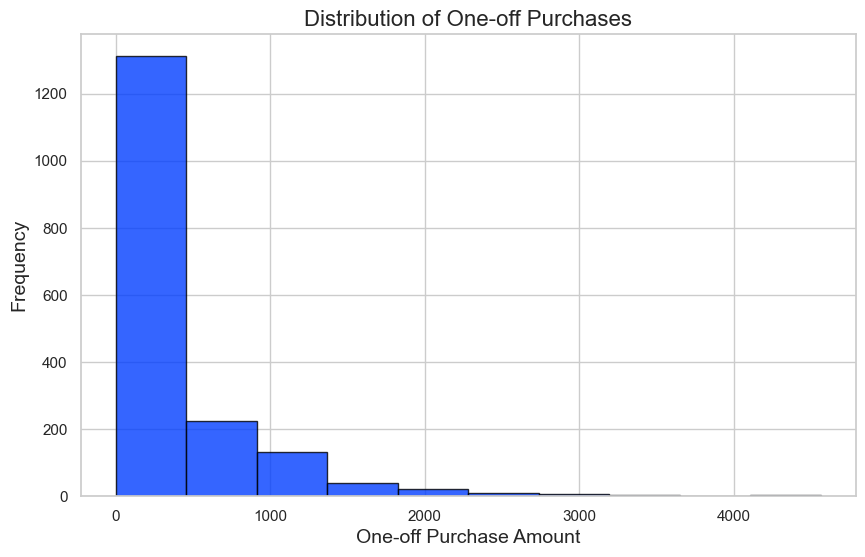

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(cash_cust['ONEOFF_PURCHASES'], bins=10, alpha=0.8, edgecolor='black')
plt.xlabel("One-off Purchase Amount", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.title("Distribution of One-off Purchases", fontsize=16)

plt.show()

### 보고서용

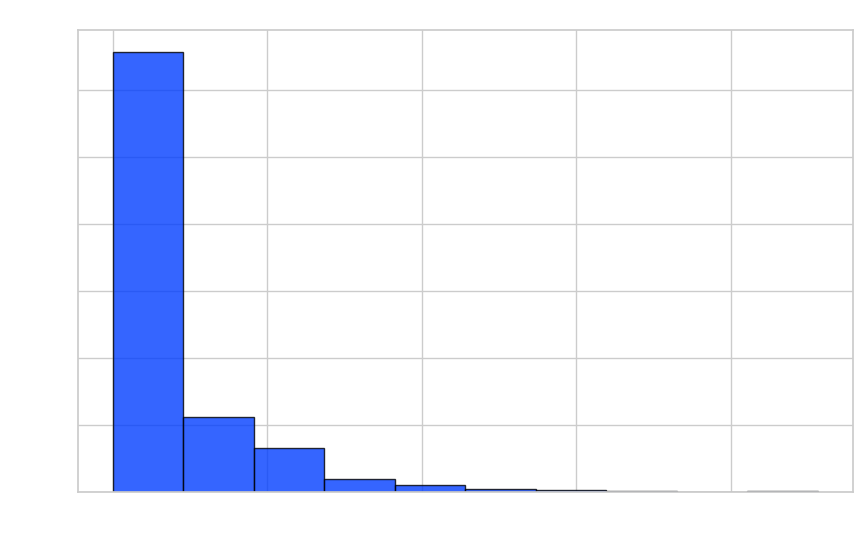

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(cash_cust['ONEOFF_PURCHASES'], bins=10, alpha=0.8, edgecolor='black')
plt.xlabel("One-off Purchase Amount",color='white')
plt.ylabel("Frequency",color='white')
plt.title("Distribution of One-off Purchases", color='white')

plt.tick_params(colors='white')           # 축 눈금
plt.savefig('ONEOFF_PURCHASES.png', transparent=True)
# 그래프 출력
plt.show()

## 일회성 구매 구간별 합계

/var/folders/b8/3v2wwvpj5j90k29tbr4zfpbm0000gn/T/ipykernel_98004/2261755801.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<BarContainer object of 2 artists>

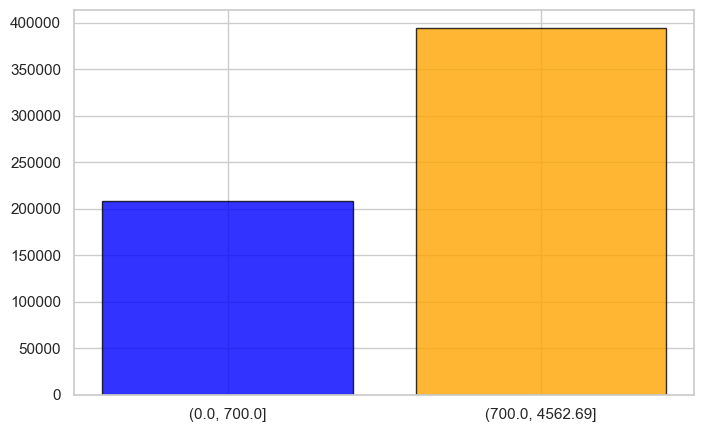

In [ ]:
data = cash_cust['ONEOFF_PURCHASES']
bins = [0, 700, data.max()]  # 0~500, 500~최대값
data_cut = pd.cut(data, bins=bins)  # 데이터 구간화
sum_by_bin = data.groupby(data_cut).sum()  # 각 구간별 금액 합산
plt.figure(figsize=(8, 5))
plt.bar(sum_by_bin.index.astype(str), sum_by_bin, color=['blue', 'orange'], edgecolor='black', alpha=0.8)

### 보고서용

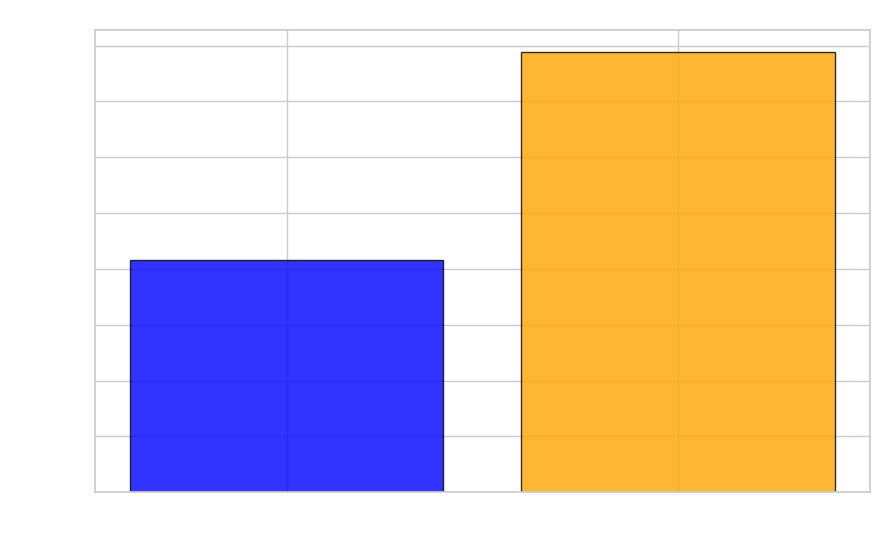

In [ ]:
# 막대그래프 그리기
plt.figure(figsize=(10, 6))
plt.bar(sum_by_bin.index.astype(str), sum_by_bin, color=['blue', 'orange'], edgecolor='black', alpha=0.8)

plt.xlabel("One-off Purchase Ranges", color='white')
plt.ylabel("Total Amount", color='white')
plt.title("Total One-off Purchases by Range", color='white')
plt.xticks(ha='right', color='white')
plt.tick_params(colors='white')           # 축 눈금
plt.savefig('ONEOFF_PURCHASES_SUM.png', transparent=True)

# 그래프 출력
plt.show()

___
# 3. 저활성형 고객

In [ ]:
inactive_cust = for_analysis[for_analysis['cluster'] == 2]
inactive_cust

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
1,C10002,3202.467416,0.909091,0.00,0.0,0.00,6442.945483,0.000000,0.0,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
14,C10015,2772.772734,1.000000,0.00,0.0,0.00,346.811390,0.000000,0.0,0.000000,0.083333,1,0,3000.0,805.647974,989.962866,0.000000,12,2
15,C10016,6886.213231,1.000000,1611.70,0.0,1611.70,2301.491267,0.500000,0.0,0.500000,0.166667,4,11,8000.0,1993.439277,2109.906490,0.000000,12,2
16,C10017,2072.074354,0.875000,0.00,0.0,0.00,2784.274703,0.000000,0.0,0.000000,0.250000,3,0,3000.0,391.974562,376.579631,0.000000,8,2
24,C10025,5368.571219,1.000000,0.00,0.0,0.00,798.949863,0.000000,0.0,0.000000,0.363636,4,0,6000.0,1422.726707,1657.002877,0.000000,11,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8914,C19155,181.891981,0.500000,0.00,0.0,0.00,1865.191764,0.000000,0.0,0.000000,0.500000,10,0,2000.0,4565.356495,88.057892,1.000000,6,2
8915,C19156,381.341657,1.000000,78.00,0.0,78.00,934.808869,1.000000,0.0,0.833333,0.666667,16,6,1000.0,143.118373,85.152441,0.000000,6,2
8917,C19158,1880.817982,1.000000,0.00,0.0,0.00,2335.949930,0.000000,0.0,0.000000,0.333333,5,0,2500.0,221.568190,374.197621,0.000000,6,2
8920,C19161,1055.087681,0.666667,0.00,0.0,0.00,1820.116200,0.000000,0.0,0.000000,0.333333,2,0,2000.0,54.795084,233.229870,0.000000,6,2


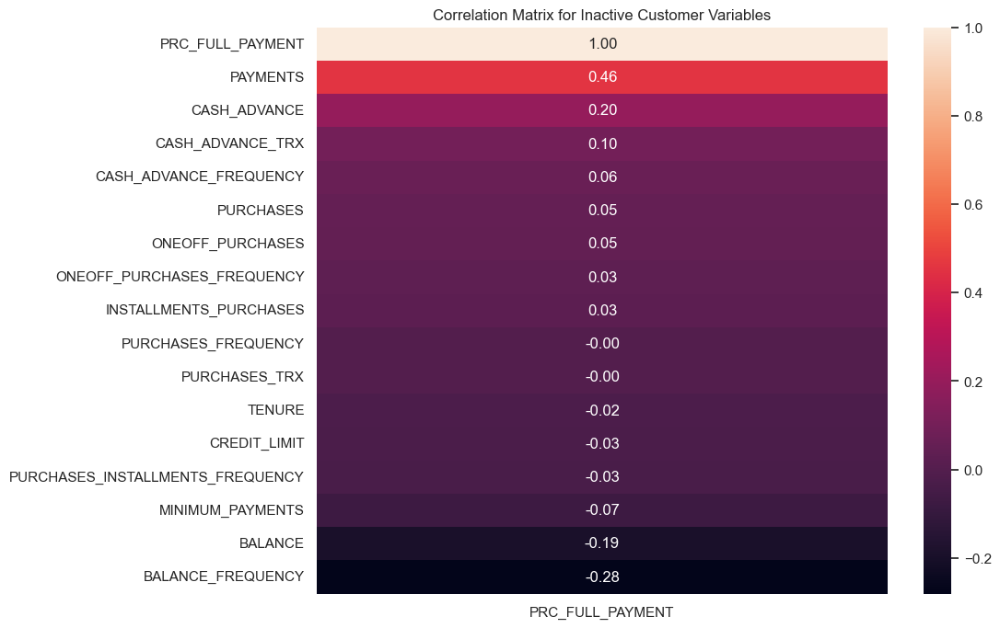

In [ ]:
correlation_matrix = inactive_cust[numeric_columns].corr()
inactive_cust_corr = correlation_matrix.sort_values(by='PRC_FULL_PAYMENT',ascending=False)
inactive_cust_corr = inactive_cust_corr.sort_values(by='PRC_FULL_PAYMENT',ascending=False, axis=1)


plt.figure(figsize=(10,8))
sns.heatmap(inactive_cust_corr[:1].T, annot=True, fmt='.2f')
plt.title("Correlation Matrix for Inactive Customer Variables")
plt.show()

### 보고서용

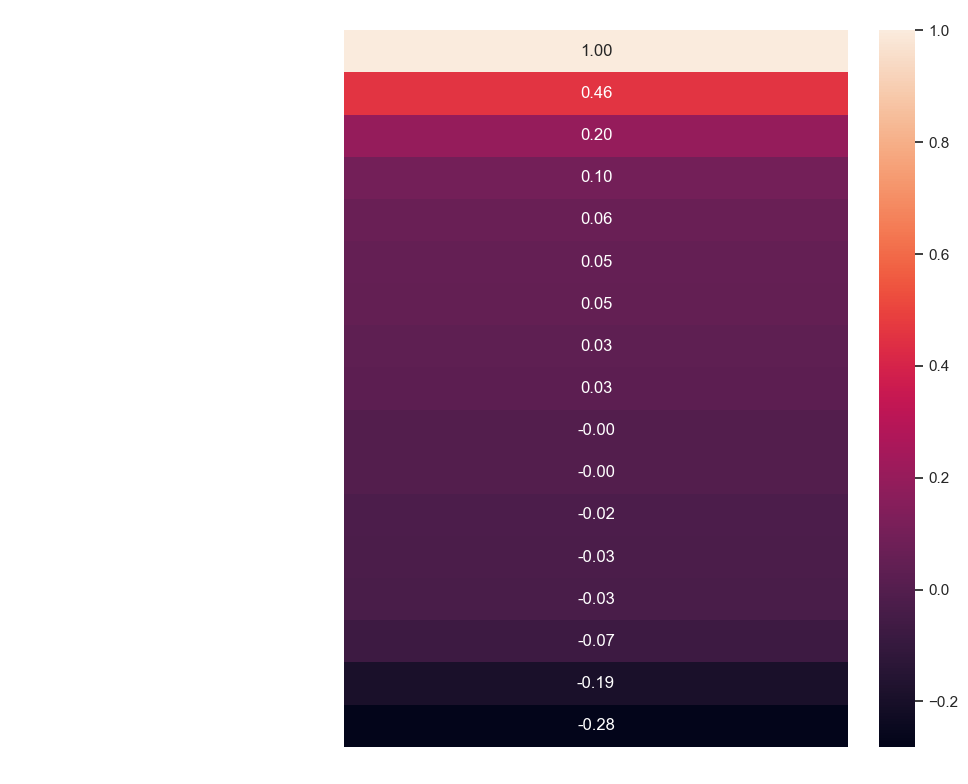

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(inactive_cust_corr[:1].T, annot=True, fmt='.2f')
plt.title("Correlation Matrix for Inactive Customer Variables", color='white')
# plt.xticks(ha='right', color='white')
plt.tick_params(colors='white')           # 축 눈금
plt.tight_layout()
plt.savefig('Correlation Matrix for Inactive Customer Variables1.png', transparent=True)


카드를 사용하고 바로 완납하는 스타일, 살짝 현금서비스이용함

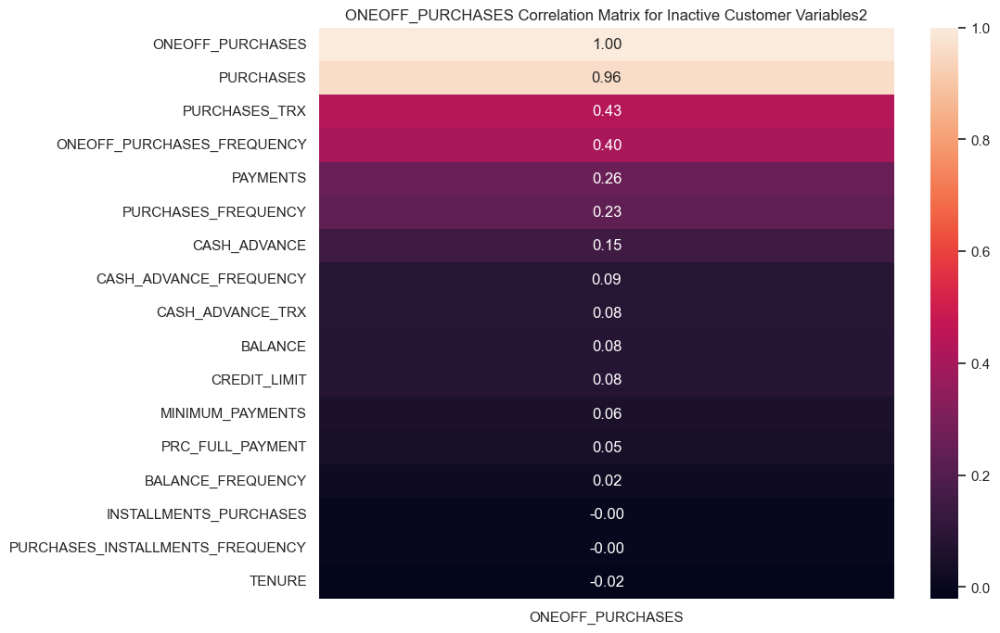

In [ ]:
inactive_cust_corr = correlation_matrix.sort_values(by='ONEOFF_PURCHASES',ascending=False)
inactive_cust_corr = inactive_cust_corr.sort_values(by='ONEOFF_PURCHASES',ascending=False, axis=1)


plt.figure(figsize=(10,8))
sns.heatmap(inactive_cust_corr[:1].T, annot=True, fmt='.2f')
plt.title("ONEOFF_PURCHASES Correlation Matrix for Inactive Customer Variables2")
plt.show()


### 보고서용

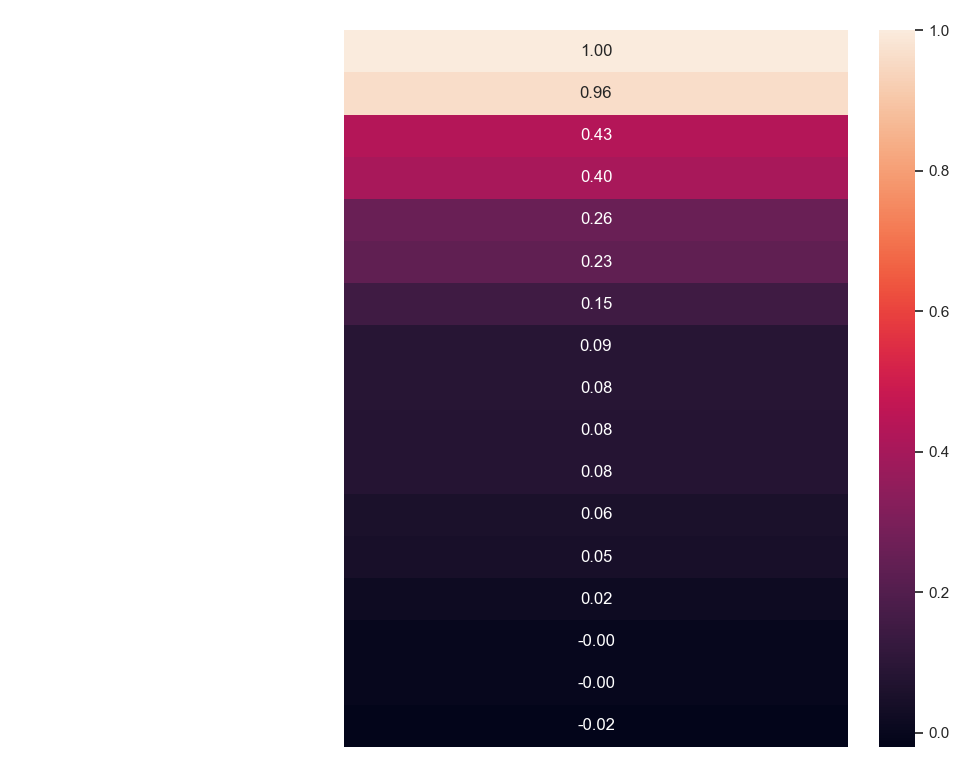

In [ ]:
plt.figure(figsize=(10,8))
inactive_cust_corr = correlation_matrix.sort_values(by='ONEOFF_PURCHASES',ascending=False)
inactive_cust_corr = inactive_cust_corr.sort_values(by='ONEOFF_PURCHASES',ascending=False, axis=1)

sns.heatmap(inactive_cust_corr[:1].T, annot=True, fmt='.2f')
plt.title("Correlation Matrix for Inactive Customer Variables", color='white')
# plt.xticks(ha='right', color='white')
plt.tick_params(colors='white')           # 축 눈금
plt.tight_layout()
plt.savefig('Correlation Matrix for Inactive Customer Variables2.png', transparent=True)


이 고객군도 총구매액이 일회성구매랑 상관계수가 높음

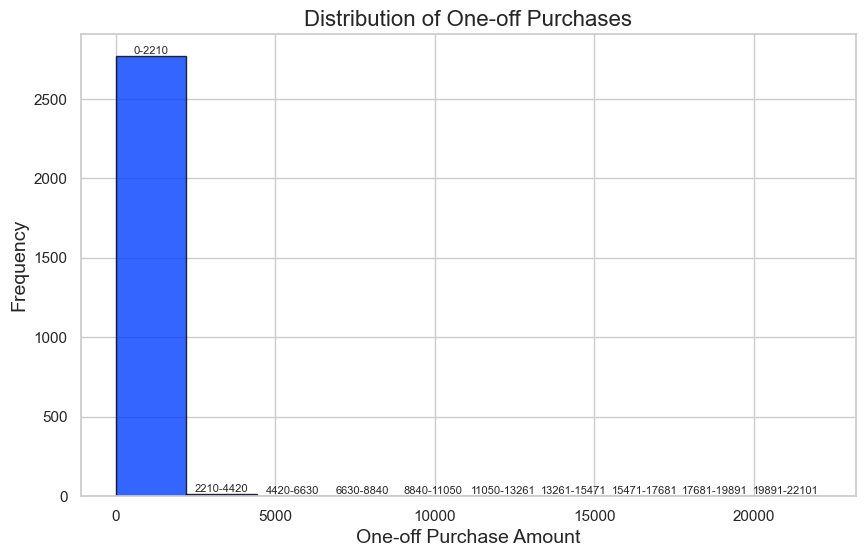

In [ ]:

plt.figure(figsize=(10, 6))

# 히스토그램 생성
counts, bins, patches = plt.hist(inactive_cust['ONEOFF_PURCHASES'], bins=10, alpha=0.8, edgecolor='black')

# 각 바의 범위와 빈도 표시
for count, bin_left, bin_right in zip(counts, bins[:-1], bins[1:]):
    bin_label = f"{int(bin_left)}-{int(bin_right)}"
    plt.text((bin_left + bin_right) / 2, count, bin_label, ha='center', va='bottom', fontsize=8)


plt.xlabel("One-off Purchase Amount", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.title("Distribution of One-off Purchases", fontsize=16)

plt.show()


### 보고서용

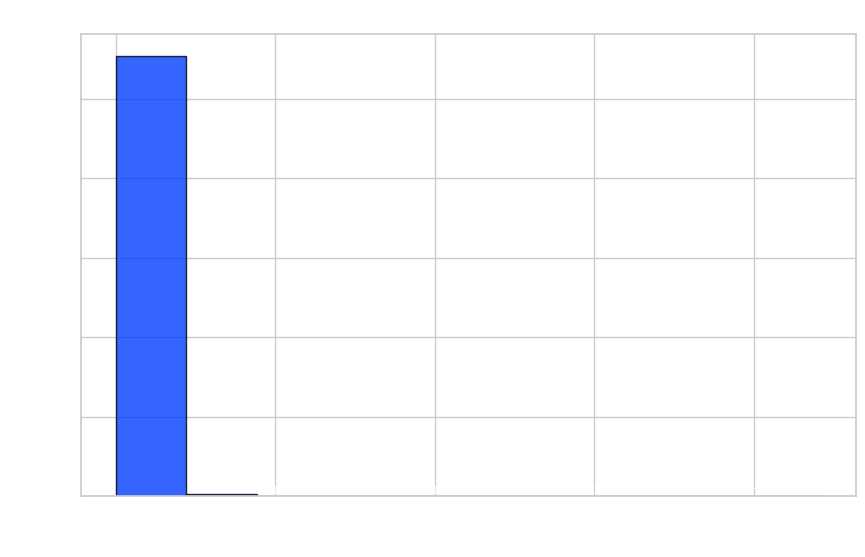

In [ ]:
plt.figure(figsize=(10, 6))

# 히스토그램 생성
counts, bins, patches = plt.hist(inactive_cust['ONEOFF_PURCHASES'], bins=10, alpha=0.8, edgecolor='black')

# 각 바의 범위와 빈도 표시
for count, bin_left, bin_right in zip(counts, bins[:-1], bins[1:]):
    bin_label = f"{int(bin_left)}-{int(bin_right)}"
    plt.text((bin_left + bin_right) / 2, count, bin_label, ha='center', va='bottom', fontsize=8, color='white')  # 흰색 텍스트

# 라벨과 제목 흰색 설정
plt.xlabel("One-off Purchase Amount", fontsize=14, color='white')
plt.ylabel("Frequency", fontsize=14, color='white')
plt.title("Distribution of One-off Purchases", fontsize=16, color='white')

# 눈금 흰색 설정
plt.xticks(color='white')
plt.yticks(color='white')
plt.tick_params(colors='white')

# 투명한 배경으로 저장
plt.savefig('ONEOFF_PURCHASES_HIST.png', transparent=True)

# 그래프 출력
plt.show()


In [ ]:
# 구간별 빈도 계산
freq_by_bin = data.groupby(data_cut).count()  # 각 구간별 빈도 계산

# 가장 높은 빈도를 가지는 범위와 값 출력
max_bin = freq_by_bin.idxmax()  # 최대 빈도의 범위
max_freq = freq_by_bin.max()  # 최대 빈도
print(f"가장 높은 바의 범위: {max_bin}, 빈도수: {max_freq}")


가장 높은 바의 범위: (0.0, 700.0], 빈도수: 654


/var/folders/b8/3v2wwvpj5j90k29tbr4zfpbm0000gn/T/ipykernel_98004/1131242690.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



/var/folders/b8/3v2wwvpj5j90k29tbr4zfpbm0000gn/T/ipykernel_98004/1713379084.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



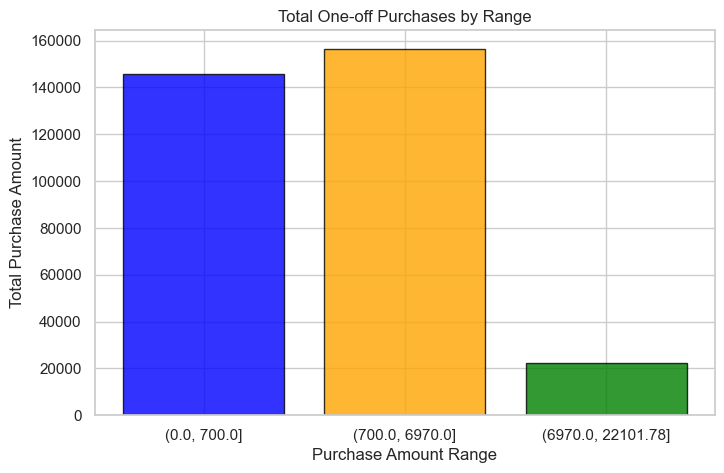

In [ ]:
data = inactive_cust['ONEOFF_PURCHASES']
bins = [0,700, 6970, data.max()]  # 700:100만원 6970:1000만원
data_cut = pd.cut(data, bins=bins)  # 데이터 구간화
sum_by_bin2 = data.groupby(data_cut).sum()  # 각 구간별 금액 합산

plt.figure(figsize=(8, 5))
plt.bar(sum_by_bin2.index.astype(str), sum_by_bin2, color=['blue', 'orange', 'green'], edgecolor='black', alpha=0.8)
plt.xlabel("Purchase Amount Range")
plt.ylabel("Total Purchase Amount")
plt.title("Total One-off Purchases by Range")
plt.show()


### 보고서용

/var/folders/b8/3v2wwvpj5j90k29tbr4zfpbm0000gn/T/ipykernel_98004/928255988.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



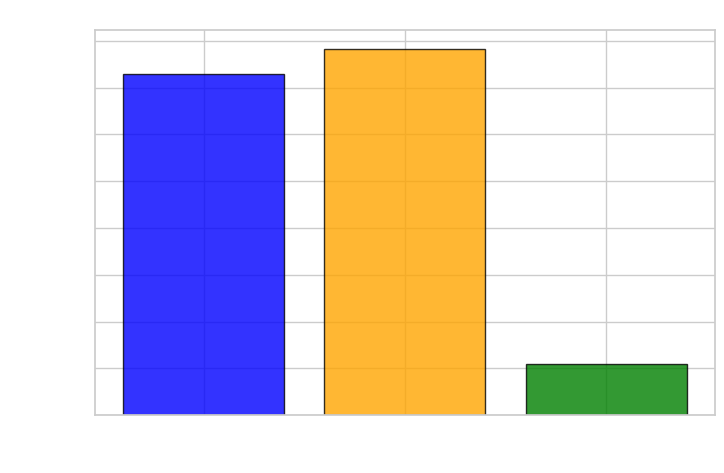

In [ ]:
data = inactive_cust['ONEOFF_PURCHASES']
bins = [0, 700, 6970, data.max()]  # 700:100만원, 6970:1000만원
data_cut = pd.cut(data, bins=bins)  # 데이터 구간화
sum_by_bin2 = data.groupby(data_cut).sum()  # 각 구간별 금액 합산

plt.figure(figsize=(8, 5))
plt.bar(sum_by_bin2.index.astype(str), sum_by_bin2, color=['blue', 'orange', 'green'], edgecolor='black', alpha=0.8)
plt.xlabel("One-off Purchase Ranges", color='white')  # x축 라벨 흰색
plt.ylabel("Total Amount", color='white')  # y축 라벨 흰색
plt.title("Total One-off Purchases by Range", color='white')  # 제목 흰색
plt.xticks(ha='right', color='white')  # x축 눈금 흰색
plt.tick_params(colors='white')  # 눈금 선 흰색

# 투명한 파일로 저장
plt.savefig('ONEOFF_PURCHASES_SUM2.png', transparent=True)

# 그래프 출력
plt.show()
